# PRML Course Project: Music Genre Classification
### By --Kartik Choudhary [B20CS025] --Vinayak Verma [B20EE079]

Importing Libraries

In [10]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline
import sklearn
import librosa
import librosa.display
import IPython.display as ipd
import warnings
warnings.filterwarnings('ignore')

In [11]:
import os
general_path = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data'
print(list(os.listdir(f'{general_path}/genres_original/')))

['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


### Exploring the Audio Data

In [12]:
y, sr = librosa.load(f'{general_path}/genres_original/reggae/reggae.00036.wav')

print('y:', y, '\n')
print('y shape:', np.shape(y), '\n')
print('Sample Rate (KHz):', sr, '\n')

#length of the audio
print('Check Len of Audio:', 661794/22050)

y: [0.02072144 0.04492188 0.05422974 ... 0.06912231 0.08303833 0.08572388] 

y shape: (661794,) 

Sample Rate (KHz): 22050 

Check Len of Audio: 30.013333333333332


In [13]:
# trimming the silence audio portions from the file
audio_file, _ = librosa.effects.trim(y)
print('Audio File:', audio_file, '\n')
print('Audio File shape:', np.shape(audio_file))

Audio File: [0.02072144 0.04492188 0.05422974 ... 0.06912231 0.08303833 0.08572388] 

Audio File shape: (661794,)


Plotting the graphs for the file

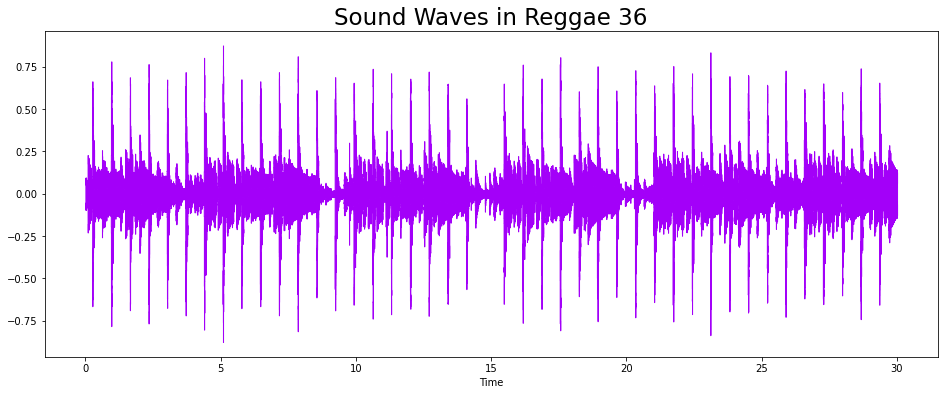

In [14]:
plt.figure(figsize = (16, 6))
librosa.display.waveshow(y = audio_file, sr = sr, color = "#A300F9");
plt.title("Sound Waves in Reggae 36", fontsize = 23);

In [15]:
import scipy, matplotlib.pyplot as plt, IPython.display as ipd, sklearn

Purpose:


Our research question was the following: Can we create a machine learning model that can classify songs in their respective categories to a reasonable accuracy?

The end goal of this project will be to use a machine learning model to classify the audio files directly, and either compare it's performance to this model or use them together to create a hybrid model.

However, for the purpose of feature exploration, it will be more useful to explore the features in a tabular state.

Examining data sources::


Data Source 1:


For this project, we were given an initial data source from Kaggle organized by Andrada Olteanu from Romania. The dataset, known as the GTZAN Dataset, is a collection of 30 second snippets from songs, with a 100 songs for 10 genres equalling a total of 1000 songs.

The dataset also contains features of audio analysis for each of the songs in .csv form that we will be using to explore the data.

While Andrada organized, uploaded, and generated features from the song snippets, the original data was recorded by G. Tzanetakis and P. Cook in IEEE Transactions on Audio and Speech Processing in 2002, a journal for the "science, technologies and applications that relate to the analysis, coding, enhancement, recognition and synthesis of audio, music, speech and language". The songs were all pulled from personal CDs, radio, microphone recordings, in order to represent a variety of recording conditions, and are all 22050Hz Mono 16-bit audio files in .wav format.

In [16]:
df=pd.read_csv(r"C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data\features_30_sec.csv")
df.iloc[:,:20].head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,rolloff_var,zero_crossing_rate_mean,zero_crossing_rate_var,harmony_mean,harmony_var,perceptr_mean,perceptr_var,tempo,mfcc1_mean
0,blues.00000.wav,661794,0.350088,0.088757,0.130228,0.002827,1784.165850,129774.064525,2002.449060,85882.761315,3805.839606,9.015054e+05,0.083045,0.000767,-4.529724e-05,0.008172,0.000008,0.005698,123.046875,-113.570648
1,blues.00001.wav,661794,0.340914,0.094980,0.095948,0.002373,1530.176679,375850.073649,2039.036516,213843.755497,3550.522098,2.977893e+06,0.056040,0.001448,1.395807e-04,0.005099,-0.000178,0.003063,67.999589,-207.501694
2,blues.00002.wav,661794,0.363637,0.085275,0.175570,0.002746,1552.811865,156467.643368,1747.702312,76254.192257,3042.260232,7.840345e+05,0.076291,0.001007,2.105576e-06,0.016342,-0.000019,0.007458,161.499023,-90.722595
3,blues.00003.wav,661794,0.404785,0.093999,0.141093,0.006346,1070.106615,184355.942417,1596.412872,166441.494769,2184.745799,1.493194e+06,0.033309,0.000423,4.583644e-07,0.019054,-0.000014,0.002712,63.024009,-199.544205
4,blues.00004.wav,661794,0.308526,0.087841,0.091529,0.002303,1835.004266,343399.939274,1748.172116,88445.209036,3579.757627,1.572978e+06,0.101461,0.001954,-1.756129e-05,0.004814,-0.000010,0.003094,135.999178,-160.337708


In [17]:
df.iloc[:,20:40].head()

,mfcc1_var,mfcc2_mean,mfcc2_var,mfcc3_mean,mfcc3_var,mfcc4_mean,mfcc4_var,mfcc5_mean,mfcc5_var,mfcc6_mean,mfcc6_var,mfcc7_mean,mfcc7_var,mfcc8_mean,mfcc8_var,mfcc9_mean,mfcc9_var,mfcc10_mean,mfcc10_var,mfcc11_mean
0,2564.207520,121.571793,295.913818,-19.168142,235.574432,42.366421,151.106873,-6.364664,167.934799,18.623499,89.180840,-13.704891,67.660492,15.343150,68.932579,-12.274110,82.204201,10.976572,63.386311,-8.326573
1,7764.555176,123.991264,560.259949,8.955127,572.810913,35.877647,264.506104,2.907320,279.932922,21.510466,156.477097,-8.560436,200.849182,23.370686,142.555954,-10.099661,166.108521,11.900497,104.358612,-5.555639
2,3319.044922,140.446304,508.765045,-29.093889,411.781219,31.684334,144.090317,-13.984504,155.493759,25.764742,74.548401,-13.664875,106.981827,11.639934,106.574875,-11.783643,65.447945,9.718760,67.908859,-13.133803
3,5507.517090,150.090897,456.505402,5.662678,257.161163,26.859079,158.267303,1.771399,268.034393,14.234031,126.794128,-4.832006,155.912079,9.286494,81.273743,-0.759186,92.114090,8.137607,71.314079,-3.200653
4,5195.291992,126.219635,853.784729,-35.587811,333.792938,22.148071,193.456100,-32.478600,336.276825,10.852294,134.831573,-23.352329,93.257095,0.498434,124.672127,-11.793437,130.073349,1.207256,99.675575,-13.088418


In [18]:
df.iloc[:,40:60].head()

,mfcc11_var,mfcc12_mean,mfcc12_var,mfcc13_mean,mfcc13_var,mfcc14_mean,mfcc14_var,mfcc15_mean,mfcc15_var,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,61.773094,8.803792,51.244125,-3.672300,41.217415,5.747995,40.554478,-5.162882,49.775421,0.752740,52.420910,-1.690215,36.524071,-0.408979,41.597103,-2.303523,55.062923,1.221291,46.936035,blues
1,105.173630,5.376327,96.197212,-2.231760,64.914291,4.220140,73.152534,-6.012148,52.422142,0.927998,55.356403,-0.731125,60.314529,0.295073,48.120598,-0.283518,51.106190,0.531217,45.786282,blues
2,57.781425,5.791199,64.480209,-8.907628,60.385151,-1.077000,57.711136,-9.229274,36.580986,2.451690,40.598766,-7.729093,47.639427,-1.816407,52.382141,-3.439720,46.639660,-2.231258,30.573025,blues
3,110.236687,6.079319,48.251999,-2.480174,56.799400,-1.079305,62.289902,-2.870789,51.651592,0.780874,44.427753,-3.319597,50.206673,0.636965,37.319130,-0.619121,37.259739,-3.407448,31.949339,blues
4,80.254066,-2.813867,86.430626,-6.933385,89.555443,-7.552725,70.943336,-9.164666,75.793404,-4.520576,86.099236,-5.454034,75.269707,-0.916874,53.613918,-4.404827,62.910812,-11.703234,55.195160,blues


That is a lot of columns!

Just doing a simple inspection of our data, we see it is 1000 rows by 60 columns. There are quite a lot of features that were generated for us by Andrada (58 in total and all numerical), so lets quickly move through them to get a better sense of our data.


In [19]:
df["chroma_stft_mean"].describe()


count    1000.000000
mean        0.378682
std         0.081705
min         0.171939
25%         0.319562
50%         0.383148
75%         0.435942
max         0.663685
Name: chroma_stft_mean, dtype: float64

In music, the term chroma feature relates to the twelve different pitch classes. Chroma-based feature can be used to categorize music with meaningful pitches (usually into 12 scales) and whose tuning can equated to the equal-tempered scale.

In our dataset, we are using the librosa package, a python package for music and audio analysis, to extract features from each of our song snippets.

Let's generate a Chromagram from one of our blues songs using librosa.

In [20]:
y, sr = librosa.load(r"C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data\genres_original\blues\blues.00000.wav")
ipd.Audio(y, rate=sr)

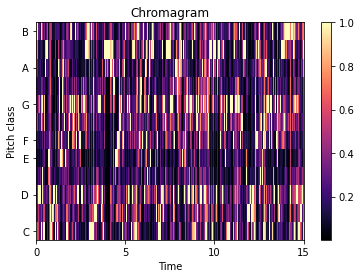

In [21]:
S = np.abs(librosa.stft(y))
chroma = librosa.feature.chroma_stft(S=S, sr=sr)
S = np.abs(librosa.stft(y, n_fft=4096))**2
chroma = librosa.feature.chroma_stft(S=S, sr=sr)
fig, ax = plt.subplots()
img = librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', ax=ax)
fig.colorbar(img, ax=ax)
ax.set(title='Chromagram')
plt.show()

For our generated features, the mean and variance was taken across the entire generated array.



In [22]:
np.mean(chroma)


0.34225398

In [23]:
df["rms_mean"].describe()


count    1000.000000
mean        0.130930
std         0.065683
min         0.005276
25%         0.086657
50%         0.122443
75%         0.175682
max         0.397973
Name: rms_mean, dtype: float64

RMS level (root mean squared) is fairly simple -- it is just proportional to the amount of energy over a period of time in the signal. This can be used to distinguish songs that are louder from each other.

This RMS value is generated using numpy and is a fairly simple calculation (again, root mean squared).

In [24]:
df["spectral_centroid_mean"].describe()


count    1000.000000
mean     2201.780898
std       715.960600
min       570.040355
25%      1627.697311
50%      2209.263090
75%      2691.294667
max      4435.243901
Name: spectral_centroid_mean, dtype: float64

The spectral centroid is a measure used to characterise an audio spectrum by finding its center of mass. It is also connected to the brightness of a sound, which refers to the higher mid and treble parts of the frequency.

We can use the librosa package again to compute this frequency that the energy of the spectrum centers upon.

Let's start by loading in one of our jazz songs.

In [25]:
x, sr = librosa.load(r"C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data\genres_original\jazz\jazz.00016.wav")
ipd.Audio(x, rate=sr)

Next we will find the spectral centroids per each frame in an audio signal, compute time for visualization, and then plot.



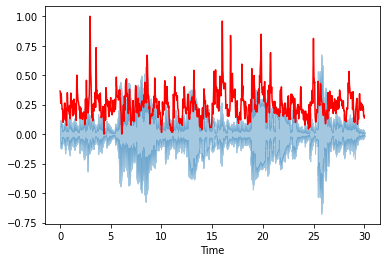

In [26]:
spectral_centroids = librosa.feature.spectral_centroid(y, sr=sr)[0]
frames = range(len(spectral_centroids))
t = librosa.frames_to_time(frames)
def normalize(y_, axis=0):
    return sklearn.preprocessing.minmax_scale(y_, axis=axis)
librosa.display.waveshow(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_centroids), color='r') # normalize for visualization purposes
plt.show()

This gives us additional information about each of the songs in our data. The features are taking the mean and variance across all of this data.

Spectral Bandwidth is similar to above, just with a weighted p to provide different measures of spectral analysis.

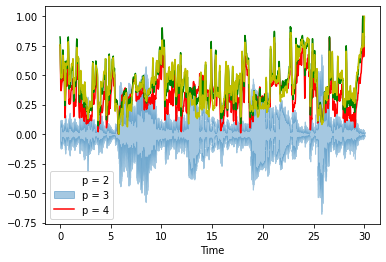

In [27]:
spectral_bandwidth_2 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr)[0]
spectral_bandwidth_3 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr, p=3)[0]
spectral_bandwidth_4 = librosa.feature.spectral_bandwidth(x+0.01, sr=sr, p=4)[0]
librosa.display.waveshow(x, sr=sr, alpha=0.4)
plt.plot(t, normalize(spectral_bandwidth_2), color='r')
plt.plot(t, normalize(spectral_bandwidth_3), color='g')
plt.plot(t, normalize(spectral_bandwidth_4), color='y')
plt.legend(('p = 2', 'p = 3', 'p = 4'))
plt.show()

The other features we will not use as there are no standardized ways of computing them, so we cannot recreate them for our new songs.

Let's check for missingness.

In [28]:
df=df[['filename', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var', 'spectral_centroid_mean',
      'spectral_centroid_var', 'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'label']]
df.isnull().any()

filename                   False
chroma_stft_mean           False
chroma_stft_var            False
rms_mean                   False
rms_var                    False
spectral_centroid_mean     False
spectral_centroid_var      False
spectral_bandwidth_mean    False
spectral_bandwidth_var     False
label                      False
dtype: bool

This looks good! No missing values for any of our columns of interest.

Next let's look at some tables and graphs.

In [29]:
df.describe()


,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000
mean,0.378682,0.086340,0.130930,0.003051,2201.780898,4.696916e+05,2242.541070,137079.155165
std,0.081705,0.007735,0.065683,0.003634,715.960600,4.008995e+05,526.316473,96455.666326
min,0.171939,0.044555,0.005276,0.000004,570.040355,7.911251e+03,898.066208,10787.185064
25%,0.319562,0.082298,0.086657,0.000942,1627.697311,1.843505e+05,1907.240605,67376.554428
50%,0.383148,0.086615,0.122443,0.001816,2209.263090,3.384862e+05,2221.392843,111977.548036
75%,0.435942,0.091256,0.175682,0.003577,2691.294667,6.121479e+05,2578.469836,182371.576801
max,0.663685,0.108111,0.397973,0.027679,4435.243901,3.036843e+06,3509.646417,694784.811549


From this chart we can note a couple of things --

Our variables are definitely all on different scales. Our max values range from 0.027 to 3,036,843, with spectral variables being the ones with high values.
There is a lot of variation for spectral centroid and not much for chroma stft or rms.
There doesn't seem to much skew to our data as our mean and max don't seem too far apart for any of our variables.
Let's do some visualizations.

In [30]:
from ggplot import *

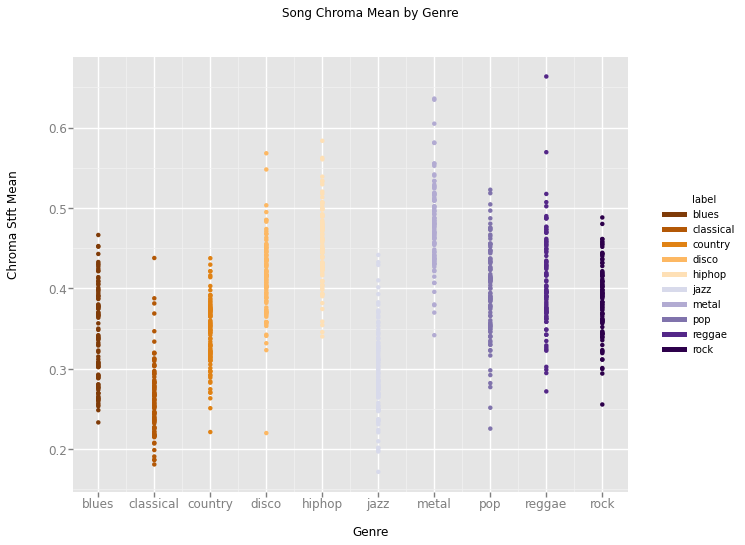

<ggplot: (150298149813)>

In [31]:
p = ggplot(df, aes(x='label', y='chroma_stft_mean', color='label')) +\
    geom_point() +\
    scale_color_brewer(type='diverging', palette=4) +\
    xlab("Genre") + ylab("Chroma Stft Mean") + ggtitle("Song Chroma Mean by Genre")
p

So we can see there's definitely a difference across our Genres when comparing the Chroma mean. Metal has the highest while classical has the lowest. Reggae has a few interesting outliers that go pretty far up as well. Let's look at those.

In [32]:
reggae_out=df[df['label']=='reggae']
reggae_out=reggae_out[reggae_out['chroma_stft_mean']>0.55]
reggae_out

,filename,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,label
851,reggae.00051.wav,0.569506,0.073010,0.117503,0.003290,4273.650129,2.503507e+06,2876.274873,203127.570132,reggae
886,reggae.00086.wav,0.663685,0.048071,0.351055,0.014395,4435.243901,3.036843e+06,2844.225245,487624.146015,reggae


In [38]:
from playsound import playsound

In [39]:
x, sr = librosa.load(r"C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data\genres_original\reggae\reggae.00051.wav")
ipd.Audio(x, rate=sr)
#general_path = r"C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data"
#run the below command if the audio player isn't working
#playsound(f'{general_path}/genres_original/pop/pop.00019.wav')

Next let's view some graphs for the spectral centroid statistics.

Locator attempting to generate 3999 ticks ([0.00025, ..., 0.9997500000000001]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 3999 ticks ([0.00025, ..., 0.9997500000000001]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 3999 ticks ([0.00025, ..., 0.9997500000000001]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 3999 ticks ([0.00025, ..., 0.9997500000000001]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 3999 ticks ([0.00025, ..., 0.9997500000000001]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 3999 ticks ([0.00025, ..., 0.9997500000000001]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 3999 ticks ([0.00025, ..., 0.9997500000000001]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 3999 ticks ([0.00025, ..., 0.9997500000000001]), which exceeds Locator.MAXTICKS (1000).
Locator attempting to generate 3999 ticks ([0.00

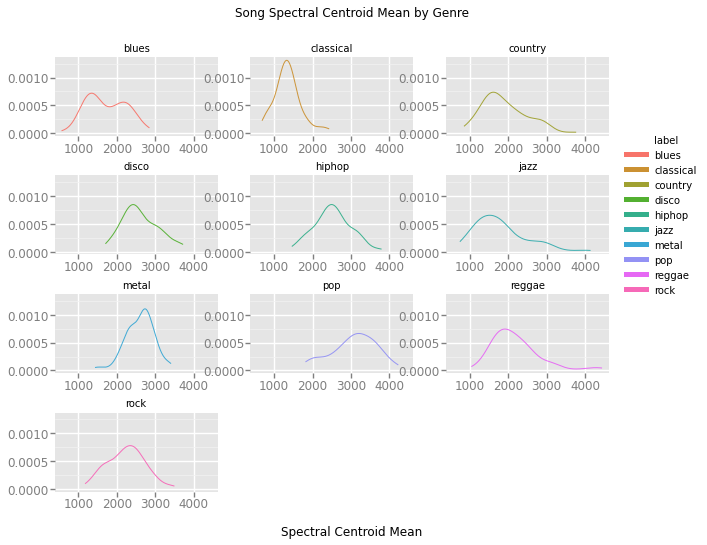

<ggplot: (150296801818)>

In [40]:
ggplot(df, aes(x='spectral_centroid_mean', color='label')) +\
    geom_density(alpha=0.95) +\
    facet_wrap("label") +\
    xlab("Spectral Centroid Mean") + ggtitle("Song Spectral Centroid Mean by Genre")

This looks very similar to our above plot with the Chroma Mean variable as they all follow very similar distributions. Let's see if we graph a scatterplot with both as the x and y values.

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or R

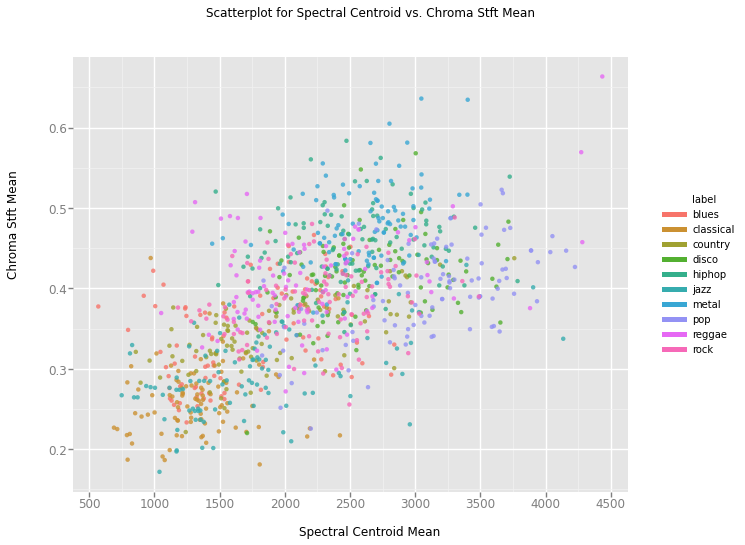

<ggplot: (150298201173)>

In [41]:
ggplot(df, aes(x='spectral_centroid_mean', y='chroma_stft_mean', color='label')) +\
    geom_point(alpha=0.80) +\
    xlab("Spectral Centroid Mean") + ylab("Chroma Stft Mean") + ggtitle("Scatterplot for Spectral Centroid vs. Chroma Stft Mean")

So -- our values aren't as linear as I thought. There is a loosely linear correlation between the two but it is not super strong.

Speaking of correlation, let's do a heatmap to see how correlated our variables are to each other.

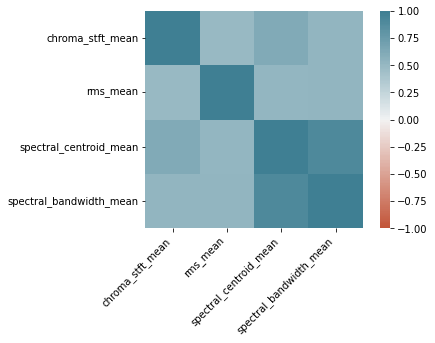

In [42]:
df_no_var=df[['filename', 'chroma_stft_mean', 'rms_mean', 'spectral_centroid_mean', 'spectral_bandwidth_mean', 'label']]
corr = df_no_var.corr()
ax = sns.heatmap(
    corr, 
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

To make this heatmap simpler, I only visualized the means for each of our variables. We see all of our variables are pretty strongly correlated together, especially our two spectral centroids. This could potentially cause problems for us in the future and it might be better to only use one of them.

For recoding variables, we could divide each category by the max of that category to get a final percent value.

In [43]:
df_no_var['chroma_stft_mean']=df_no_var['chroma_stft_mean']/df_no_var['chroma_stft_mean'].max()
df_no_var['rms_mean']=df_no_var['rms_mean']/df_no_var['rms_mean'].max()
df_no_var['spectral_centroid_mean']=df_no_var['spectral_centroid_mean']/df_no_var['spectral_centroid_mean'].max()
df_no_var['spectral_bandwidth_mean']=df_no_var['spectral_bandwidth_mean']/df_no_var['spectral_bandwidth_mean'].max()
df_no_var.describe()

,chroma_stft_mean,rms_mean,spectral_centroid_mean,spectral_bandwidth_mean
count,1000.000000,1000.000000,1000.000000,1000.000000
mean,0.570575,0.328991,0.496428,0.638965
std,0.123108,0.165044,0.161425,0.149963
min,0.259068,0.013258,0.128525,0.255885
25%,0.481496,0.217746,0.366992,0.543428
50%,0.577304,0.307667,0.498115,0.632939
75%,0.656851,0.441442,0.606797,0.734681
max,1.000000,1.000000,1.000000,1.000000


Next Part

According to Maria Von Trapp, "Music acts like a magic key to which the most tightly closed heart opens."

In this notebook, let us classify the music samples into different genres & predict the genre using an audio signal as an input. The objective of automating the music classification is to make the selection of songs quick and less cumbersome.

In [45]:
import warnings
warnings.simplefilter("ignore", UserWarning)
import os
from tqdm import tqdm
import pickle
import scipy
import sys
import pandas as pd
import numpy as np
import IPython
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
%matplotlib inline
import librosa #Python package for music & audio files
import librosa.display
import librosa.display as lplt

from tensorflow import keras
from keras.models import Sequential
from IPython.display import Audio
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import normalize
from sklearn.feature_selection import RFECV,mutual_info_regression
from sklearn.metrics import confusion_matrix, accuracy_score,classification_report
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.decomposition import PCA
from xgboost import XGBClassifier
from hyperopt import STATUS_OK, Trials, fmin, hp, tpe

LOADING & PREPROCESSING THE DATA



In [46]:
#Reading the csv file
final_data = pd.read_csv(r"C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data\features_3_sec.csv")
final_data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [47]:
final_data.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9990 entries, 0 to 9989
Data columns (total 60 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   filename                 9990 non-null   object 
 1   length                   9990 non-null   int64  
 2   chroma_stft_mean         9990 non-null   float64
 3   chroma_stft_var          9990 non-null   float64
 4   rms_mean                 9990 non-null   float64
 5   rms_var                  9990 non-null   float64
 6   spectral_centroid_mean   9990 non-null   float64
 7   spectral_centroid_var    9990 non-null   float64
 8   spectral_bandwidth_mean  9990 non-null   float64
 9   spectral_bandwidth_var   9990 non-null   float64
 10  rolloff_mean             9990 non-null   float64
 11  rolloff_var              9990 non-null   float64
 12  zero_crossing_rate_mean  9990 non-null   float64
 13  zero_crossing_rate_var   9990 non-null   float64
 14  harmony_mean            

In [48]:
final_data.shape


(9990, 60)

In [49]:
final_data.dtypes


filename                    object
length                       int64
chroma_stft_mean           float64
chroma_stft_var            float64
rms_mean                   float64
rms_var                    float64
spectral_centroid_mean     float64
spectral_centroid_var      float64
spectral_bandwidth_mean    float64
spectral_bandwidth_var     float64
rolloff_mean               float64
rolloff_var                float64
zero_crossing_rate_mean    float64
zero_crossing_rate_var     float64
harmony_mean               float64
harmony_var                float64
perceptr_mean              float64
perceptr_var               float64
tempo                      float64
mfcc1_mean                 float64
mfcc1_var                  float64
mfcc2_mean                 float64
mfcc2_var                  float64
mfcc3_mean                 float64
mfcc3_var                  float64
mfcc4_mean                 float64
mfcc4_var                  float64
mfcc5_mean                 float64
mfcc5_var           

In [50]:
final_data = final_data.drop(labels='filename',axis=1)


In [52]:
#audio file
audio = r"C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data\genres_original\classical\classical.00035.wav"
#Load & decode the audio as a time series, where sr represents the sampling rate
data , sr = librosa.load(audio)
print(type(data), type(sr))

<class 'numpy.ndarray'> <class 'int'>


In [53]:
librosa.load(audio, sr=45600)


(array([0.0092342 , 0.01324757, 0.01445981, ..., 0.01872812, 0.01651549,
        0.00846823], dtype=float32),
 45600)

In [54]:
#Playing the audio within the notebook
IPython.display.Audio(data, rate=sr)

AUDIO VISUALIZATION



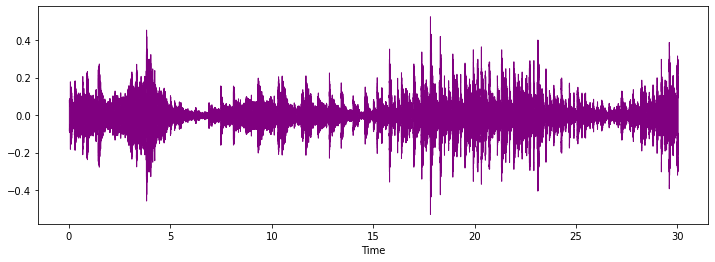

In [55]:
#Plotting the raw wave file to quickly scan the audio data & contrast which genres might be more similar.

plt.figure(figsize=(12,4))
librosa.display.waveshow(data, color = "Purple")
plt.show()

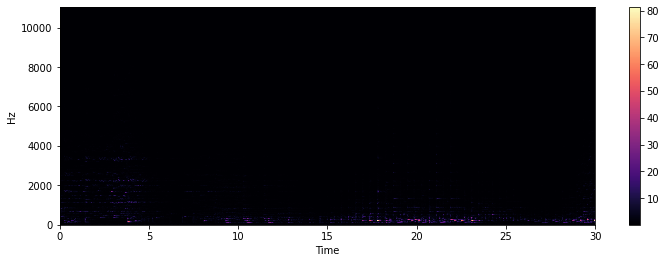

In [56]:
#Spectrogram
stft = librosa.stft(data)
stft_db = librosa.amplitude_to_db(abs(stft))
plt.figure(figsize=(12,4))
librosa.display.specshow(stft, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

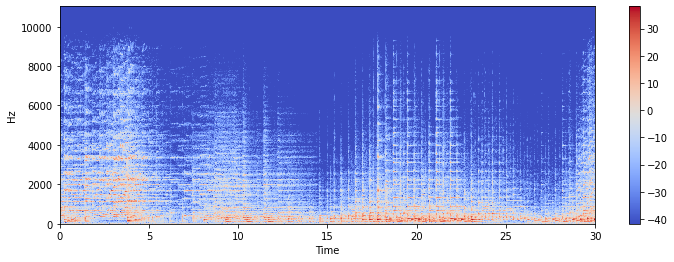

In [57]:
stft = librosa.stft(data)
stft_db = librosa.amplitude_to_db(abs(stft))
plt.figure(figsize=(12,4))
librosa.display.specshow(stft_db, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar()

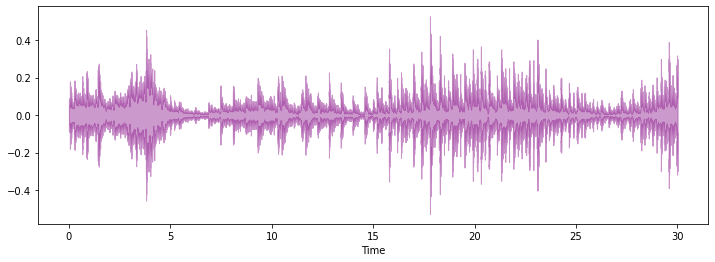

In [58]:
#computing the rolloff frequency for each frame in a signal
spectral_rolloff = librosa.feature.spectral_rolloff(data+0.01, sr=sr)[0]
plt.figure(figsize=(12,4))
librosa.display.waveshow(data, sr=sr, alpha=0.4, color='Purple')

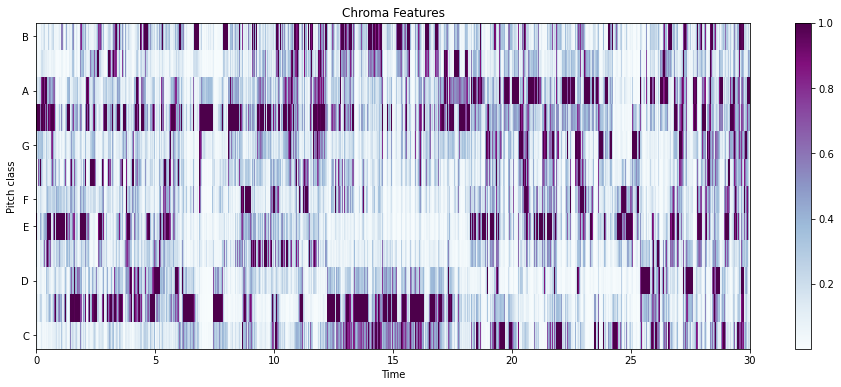

In [59]:
#Chroma feature or chromagram closely relates to the twelve different pitch classes.
#Chroma features capture harmonic & melodic characteristics of music while being robust to changes.
chroma = librosa.feature.chroma_stft(data, sr=sr)
plt.figure(figsize=(16,6))
lplt.specshow(chroma, sr=sr, x_axis='time', y_axis='chroma', cmap='BuPu')
plt.colorbar()
plt.title("Chroma Features")
plt.show()

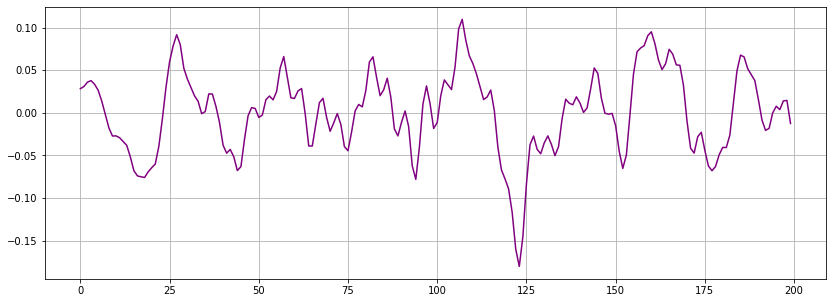

In [60]:
#The rate at which zero-crossings occur is a simple measure of the frequency content of a signal.
#Zero crossing is said to occur if successive samples have different algebric signs.
start = 1000
end = 1200
plt.figure(figsize=(14,5))
plt.plot(data[start:end], color='Purple')
plt.grid()

In [61]:
zero_cross_rate = librosa.zero_crossings(data[start:end], pad=False)
print("The number of zero crossings is:",sum(zero_cross_rate))

The number of zero crossings is: 27


EXTRACTING AND SCALING THE FEATURES



In [62]:
#To convert categorical data into model-understandable numerica data
class_list = final_data.iloc[:, -1]
convertor = LabelEncoder()

In [63]:
#Fitting the label encoder & return encoded labels
y = convertor.fit_transform(class_list)

In [64]:
y


array([0, 0, 0, ..., 9, 9, 9])

In [65]:
print(final_data.iloc[:, :-1])


      length  chroma_stft_mean  chroma_stft_var  rms_mean   rms_var  \
0      66149          0.335406         0.091048  0.130405  0.003521   
1      66149          0.343065         0.086147  0.112699  0.001450   
2      66149          0.346815         0.092243  0.132003  0.004620   
3      66149          0.363639         0.086856  0.132565  0.002448   
4      66149          0.335579         0.088129  0.143289  0.001701   
...      ...               ...              ...       ...       ...   
9985   66149          0.349126         0.080515  0.050019  0.000097   
9986   66149          0.372564         0.082626  0.057897  0.000088   
9987   66149          0.347481         0.089019  0.052403  0.000701   
9988   66149          0.387527         0.084815  0.066430  0.000320   
9989   66149          0.369293         0.086759  0.050524  0.000067   

      spectral_centroid_mean  spectral_centroid_var  spectral_bandwidth_mean  \
0                1773.065032          167541.630869              19

In [66]:
#Standard scaler is used to standardize features & look like standard normally distributed data
fit = StandardScaler()
X = fit.fit_transform(np.array(final_data.iloc[:, :-1], dtype = float))

In [67]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33)


In [68]:
len(y_train)


6693

In [69]:
len(y_test)


3297

In [70]:
#The loss is calculated using sparse_categorical_crossentropy function
def trainModel(model, epochs, optimizer):
    batch_size = 128
    model.compile(optimizer=optimizer,
                  loss='sparse_categorical_crossentropy',
                   metrics='accuracy'
    )
    return model.fit(X_train, y_train, validation_data=(X_test, y_test), epochs=epochs, 
                     batch_size=batch_size)

In [71]:
#Plotting the curves
def plotValidate(history):
    print("Validation Accuracy",max(history.history["val_accuracy"]))
    pd.DataFrame(history.history).plot(figsize=(12,6))
    plt.show()
    

<AxesSubplot:>

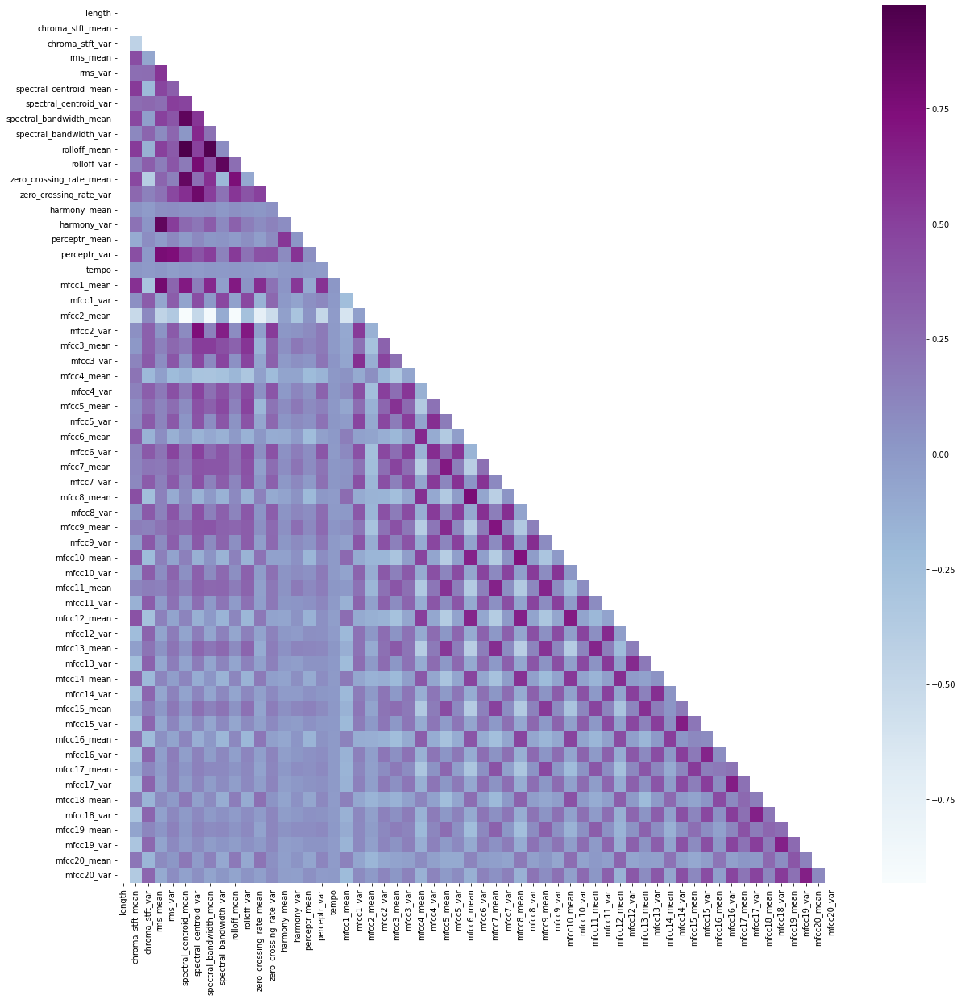

In [72]:
#correlation
corr = final_data.corr()
#Creation of a mask for the heatmap
mask = np.zeros_like(corr)
mask[np.triu_indices_from(mask)] = True
plt.subplots(figsize=(20, 20))
sns.heatmap(corr, mask=mask, cmap="BuPu")

XGBOOST

* XGBoost (eXtreme Gradient Boosting) is a popular supervised-learning algorithm used for regression and classification on large datasets. It uses sequentially-built shallow decision trees to provide accurate results and a highly-scalable training method that avoids overfitting.

* XGBClassifier is a scikit-learn API compatible class for classification.

In [73]:
model = XGBClassifier(n_estimators=1000)
model.fit(X_train,y_train,eval_metric='merror')

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.300000012, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=1000,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...)

In [74]:
y_pred_train = model.predict(X_train)
y_pred_test = model.predict(X_test)
target_names = sorted(set(y))

print(f'Training accuracy: {accuracy_score(y_train,y_pred_train)}')
print(f'Training:\n {classification_report(y_train, y_pred_train, labels=target_names)}')
print(f'Testing accuracy: {accuracy_score(y_test,y_pred_test)}')
print(f'Testing:\n {classification_report(y_test, y_pred_test, labels=target_names)}')

Training accuracy: 0.9994023606753324
Training:
               precision    recall  f1-score   support

           0       1.00      1.00      1.00       692
           1       1.00      1.00      1.00       648
           2       1.00      1.00      1.00       670
           3       1.00      1.00      1.00       662
           4       1.00      1.00      1.00       661
           5       1.00      1.00      1.00       677
           6       1.00      1.00      1.00       657
           7       1.00      1.00      1.00       681
           8       1.00      1.00      1.00       656
           9       1.00      1.00      1.00       689

    accuracy                           1.00      6693
   macro avg       1.00      1.00      1.00      6693
weighted avg       1.00      1.00      1.00      6693

Testing accuracy: 0.8986957840461025
Testing:
               precision    recall  f1-score   support

           0       0.89      0.93      0.90       308
           1       0.94      0.97   

<AxesSubplot:>

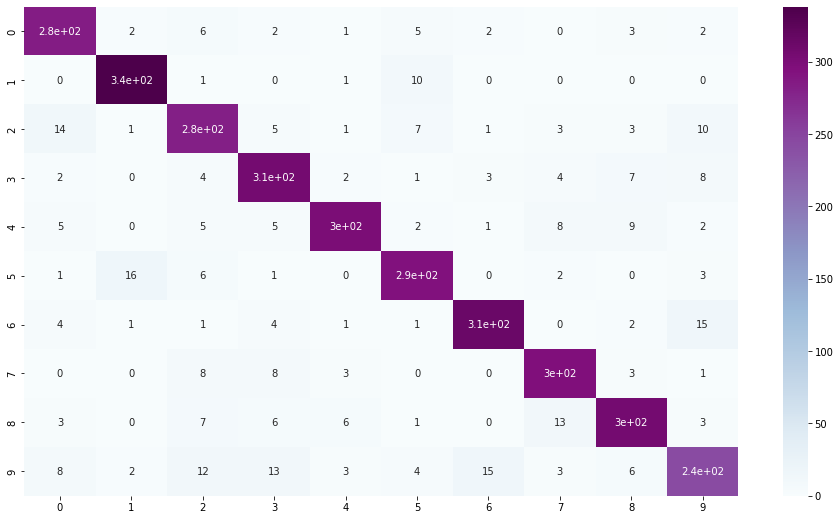

In [75]:
#Confusion matrix
conf_mat = confusion_matrix(y_test, y_pred_test)
plt.figure(figsize = (16, 9))
sns.heatmap(conf_mat,cmap="BuPu", annot=True, xticklabels = target_names, yticklabels = target_names )

Convolutional Neural Network (CNN)



In [76]:
#Here, we use Adam optimizer to train the model
#All of the hidden layers are using RELU activation function
#Output Layer uses softmax function


model = keras.models.Sequential([
    keras.layers.Dense(512, activation="relu", input_shape=(X_train.shape[1],)),
    keras.layers.Dropout(0.2),
    
    keras.layers.Dense(256,activation="relu"),
    keras.layers.Dropout(0.2),
    
    keras.layers.Dense(128,activation="relu"),
    keras.layers.Dropout(0.2),
    
    keras.layers.Dense(64,activation="relu"),
    keras.layers.Dropout(0.2),
    
    keras.layers.Dense(10, activation="softmax"),
    
])
print(model.summary())
model_history = trainModel(model=model, epochs=1500, optimizer='adam')

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               30208     
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dropout_2 (Dropout)         (None, 128)               0         
                                                                 
 dense_3 (Dense)             (None, 64)                8

In [77]:
test_loss, test_accuracy = model.evaluate(X_test, y_test, batch_size=128)
print("The test loss is :",test_loss)
print("\nThe test Accuracy is :",test_accuracy*100)

26/26 [==============================] - 0s 3ms/step - loss: 0.7236 - accuracy: 0.9230
The test loss is : 0.7235681414604187

The test Accuracy is : 92.29602813720703


Validation Accuracy 0.9353958368301392


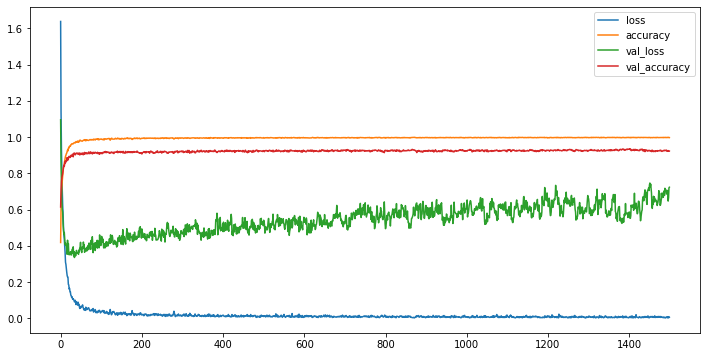

In [78]:
#Plot the loss & accuracy curves for training & validation
plotValidate(model_history)

CONCLUSION

According to Anamika Mishra, "Music gives wings to heart & takes it to the world of joy."

According to Martin Luther, "Music is a fair & glorious gift of God."

Hence, from this notebook we can conclude that Music Genre Classification is one of the many branches of music information retrieval. Neural Networks are very effective in it & tensorflow is very useful in implementing Convolutional Neural Network (CNN) that helps in the classifying process especially to classify music clips into different genres

#### Using SVM kernel and logistic regression

In [79]:
import os

from sklearn import preprocessing
from sklearn.model_selection import train_test_split
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve
from sklearn.cluster import KMeans
import seaborn as sns
import sys
import copy
import random

import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt

In [81]:
data = pd.read_csv(r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data\features_3_sec.csv')
# we dont't want serial number 
data = data.iloc[0:, 1:] 
data.head()

,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,3714.560359,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,3869.682242,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,3997.639160,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,3568.300218,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,3469.992864,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [82]:
d = []
for i in data[data.columns[58]]:
    if i == 'blues':
        d.append(0)
    if i == 'classical':
        d.append(1)
    if i == 'country':
        d.append(2)
    if i == 'disco':
        d.append(3)
    if i == 'hiphop':
        d.append(4)
    if i == 'jazz':
        d.append(5)
    if i == 'metal':
        d.append(6)
    if i == 'pop':
        d.append(7)
    if i == 'reggae':
        d.append(8)
    if i == 'rock':
        d.append(9)

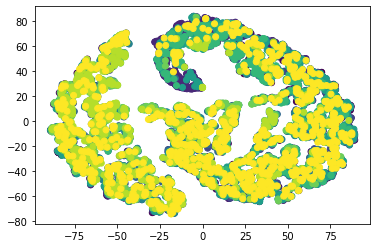

In [83]:
from sklearn.manifold import TSNE
tsne = TSNE(n_components=2).fit_transform(data.drop(columns= 'label'))
plt.scatter(tsne[:,0], tsne[:,1],c=d)

In [84]:
data.describe()


,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,rolloff_mean,...,mfcc16_mean,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var
count,9990.0,9990.000000,9990.000000,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,9.990000e+03,9990.000000,...,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000,9990.000000
mean,66149.0,0.379534,0.084876,0.130859,2.676388e-03,2199.219431,4.166727e+05,2241.385959,1.182711e+05,4566.076592,...,1.448240,49.988755,-4.198706,51.962753,0.739943,52.488851,-2.497306,54.973829,-0.917584,57.322614
std,0.0,0.090466,0.009637,0.068545,3.585628e-03,751.860611,4.349644e+05,543.854449,1.013505e+05,1642.065335,...,5.735149,34.442816,5.677379,36.400669,5.181313,38.177120,5.111799,41.585677,5.253243,46.444212
min,66149.0,0.107108,0.015345,0.000953,4.379535e-08,472.741636,8.118813e+02,499.162910,1.183520e+03,658.336276,...,-26.850016,1.325786,-27.809795,1.624544,-20.733809,3.437439,-27.448456,3.065302,-35.640659,0.282131
25%,66149.0,0.315698,0.079833,0.083782,6.145900e-04,1630.680158,1.231961e+05,1887.455790,4.876553e+04,3378.311110,...,-2.227478,29.584894,-7.951722,29.863448,-2.516638,29.636197,-5.734123,30.496412,-4.004475,30.011365
50%,66149.0,0.384741,0.085108,0.121253,1.491318e-03,2208.628236,2.650692e+05,2230.575595,8.996072e+04,4631.377892,...,1.461623,41.702393,-4.443021,42.393583,0.733772,41.831377,-2.702366,43.435253,-1.030939,44.332155
75%,66149.0,0.442443,0.091092,0.176328,3.130862e-03,2712.581884,5.624152e+05,2588.340505,1.585674e+05,5591.634521,...,5.149752,59.274619,-0.726945,61.676964,3.888734,62.033906,0.514246,65.328602,2.216603,68.210421
max,66149.0,0.749481,0.120964,0.442567,3.261522e-02,5432.534406,4.794119e+06,3708.147554,1.235143e+06,9487.446477,...,39.144405,683.932556,34.048843,529.363342,36.970322,629.729797,31.365425,1143.230591,34.212101,910.473206


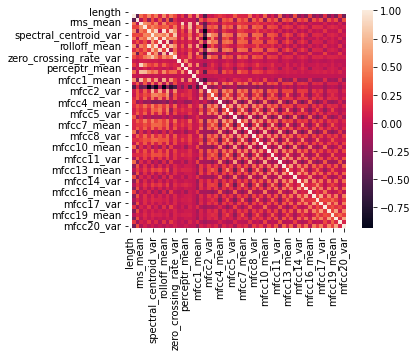

In [85]:
corr = data.corr()
# corr = data.corr()
plt.figure()
ax = sns.heatmap(
    corr, 
#     vmin=-1, vmax=1, center=0,
#     cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)

In [86]:
data.columns


Index(['length', 'chroma_stft_mean', 'chroma_stft_var', 'rms_mean', 'rms_var',
       'spectral_centroid_mean', 'spectral_centroid_var',
       'spectral_bandwidth_mean', 'spectral_bandwidth_var', 'rolloff_mean',
       'rolloff_var', 'zero_crossing_rate_mean', 'zero_crossing_rate_var',
       'harmony_mean', 'harmony_var', 'perceptr_mean', 'perceptr_var', 'tempo',
       'mfcc1_mean', 'mfcc1_var', 'mfcc2_mean', 'mfcc2_var', 'mfcc3_mean',
       'mfcc3_var', 'mfcc4_mean', 'mfcc4_var', 'mfcc5_mean', 'mfcc5_var',
       'mfcc6_mean', 'mfcc6_var', 'mfcc7_mean', 'mfcc7_var', 'mfcc8_mean',
       'mfcc8_var', 'mfcc9_mean', 'mfcc9_var', 'mfcc10_mean', 'mfcc10_var',
       'mfcc11_mean', 'mfcc11_var', 'mfcc12_mean', 'mfcc12_var', 'mfcc13_mean',
       'mfcc13_var', 'mfcc14_mean', 'mfcc14_var', 'mfcc15_mean', 'mfcc15_var',
       'mfcc16_mean', 'mfcc16_var', 'mfcc17_mean', 'mfcc17_var', 'mfcc18_mean',
       'mfcc18_var', 'mfcc19_mean', 'mfcc19_var', 'mfcc20_mean', 'mfcc20_var',
       'label'

### FEATURES

In [87]:
features = data.drop(columns= 'label')
# labels = data[data.columns[58]]
labels = pd.DataFrame(d)

In [88]:
labels = np.array(labels).reshape(9990)
print(labels)
print(labels.shape)

[0 0 0 ... 9 9 9]
(9990,)


NORMALISE

In [89]:
min_max_scaler = preprocessing.MinMaxScaler()
features_scaled = min_max_scaler.fit_transform(features)

# new data frame with the new scaled data. 
features_scaled = pd.DataFrame(features_scaled, columns = features.columns)

SPLIT AND TRAIN

In [90]:
def linear_classification_train(model, features, labels, test_split_size, title = "Default"):
    """
    input :
    takes scaled features and labels
    split size for test
    model
    
    output : 
    accuracy after fitting the model and testing on test split
    """
    x_train, x_test, y_train, y_test = train_test_split(features, labels, test_size=test_split_size, random_state=42)
    model.fit(x_train, y_train)
    preds = model.predict(x_test)
    print('Accuracy', title, ':', round(accuracy_score(y_test, preds), 4)*100, '\n')
    plt.figure()
#     plt.show(confusion_matrix(y_test, preds))
    ax = sns.heatmap(
        confusion_matrix(y_test, preds), 
#         vmin=-1, vmax=1, center=0,
#         cmap=sns.diverging_palette(20, 220, n=200),
        square=True,annot = True,
        cmap=plt.cm.Blues
    )  

Logistic regression

Experimented with :

Saga
Sag
Newton-cg
lbfgs gives best accuracy

Accuracy Logistic Regression : 70.12 



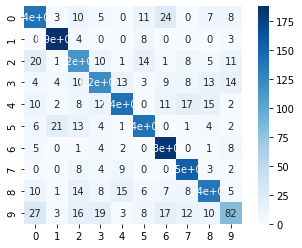

In [91]:
model = LogisticRegression(random_state=0, solver='lbfgs', multi_class='multinomial')
linear_classification_train(model, features_scaled, labels, 0.2, "Logistic Regression")

Accuracy SVM linear kernel : 74.11999999999999 



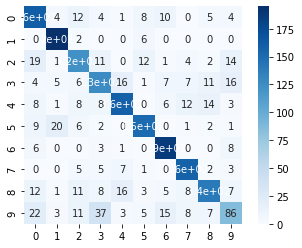

In [92]:
from sklearn.svm import SVC
model = SVC(C=1.0,kernel='linear',random_state=0)
linear_classification_train(model, features_scaled, labels, 0.2, "SVM linear kernel")

Accuracy SVM poly kernel of degree 2 : 76.98 



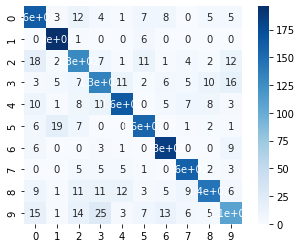

In [93]:
model = SVC(C=1.0,kernel='poly',degree=2,random_state=0)
linear_classification_train(model, features_scaled, labels, 0.2, "SVM poly kernel of degree 2")

Accuracy SVM poly kernel of degree 3 : 81.17999999999999 



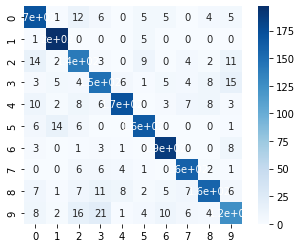

In [94]:
model = SVC(C=1.0,kernel='poly',degree=3,random_state=0)
linear_classification_train(model, features_scaled, labels, 0.2, "SVM poly kernel of degree 3")

Accuracy SVM poly kernel of degree 4 : 86.79 



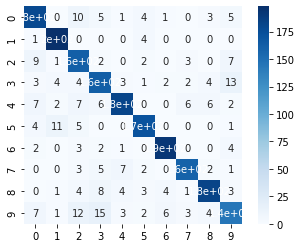

In [95]:
model = SVC(C=1.0,kernel='poly',degree=4,random_state=0)
linear_classification_train(model, features_scaled, labels, 0.2, "SVM poly kernel of degree 4")

Accuracy SVM poly kernel of degree 5 : 88.64 



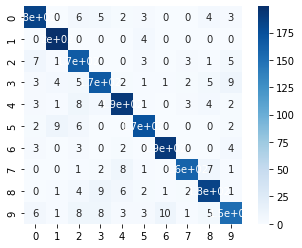

In [96]:
model = SVC(C=1.0,kernel='poly',degree=5,random_state=0)
linear_classification_train(model, features_scaled, labels, 0.2, "SVM poly kernel of degree 5")

Accuracy SVM poly kernel of degree 6 : 89.59 



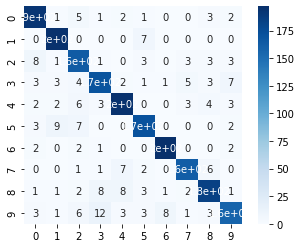

In [97]:
model = SVC(C=1.0,kernel='poly',degree=6,random_state=0)
linear_classification_train(model, features_scaled, labels, 0.2, "SVM poly kernel of degree 6")

Accuracy SVM poly kernel of degree 7 : 89.59 



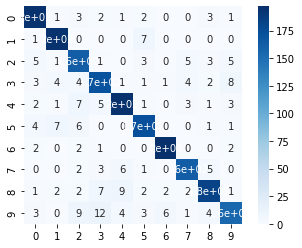

In [98]:
model = SVC(C=1.0,kernel='poly',degree=7,random_state=0)
linear_classification_train(model, features_scaled, labels, 0.2, "SVM poly kernel of degree 7")

Accuracy SVM rbf kernel c=1 : 75.88000000000001 

Accuracy SVM rbf kernel c=2 : 79.17999999999999 



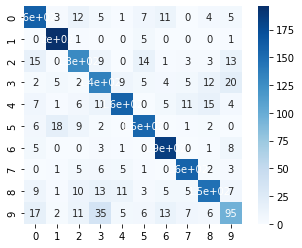

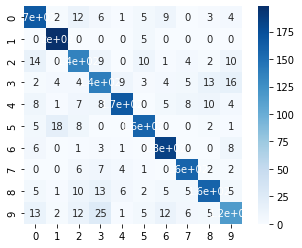

In [99]:
for i in range(1,3):
    c=i
    model = SVC(C=i,kernel='rbf',random_state=0)
    linear_classification_train(model, features_scaled, labels, 0.2, "SVM rbf kernel c=" + str(c))

Accuracy SVM rbf kernel c=10 : 85.89 

Accuracy SVM rbf kernel c=20 : 87.29 

Accuracy SVM rbf kernel c=30 : 89.34 

Accuracy SVM rbf kernel c=40 : 89.64 

Accuracy SVM rbf kernel c=50 : 89.84 

Accuracy SVM rbf kernel c=60 : 89.89 

Accuracy SVM rbf kernel c=70 : 90.29 

Accuracy SVM rbf kernel c=80 : 90.69 

Accuracy SVM rbf kernel c=90 : 90.84 

Accuracy SVM rbf kernel c=100 : 91.14 



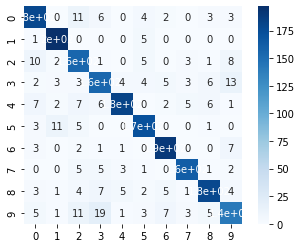

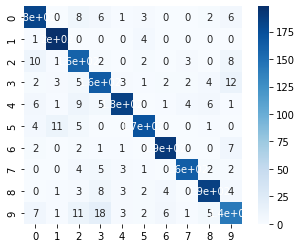

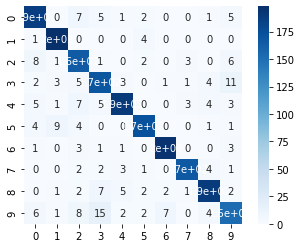

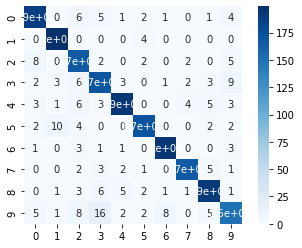

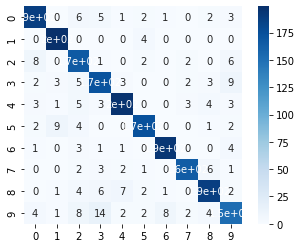

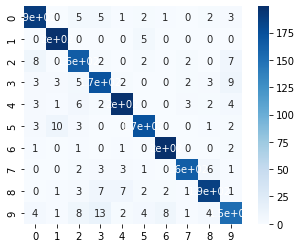

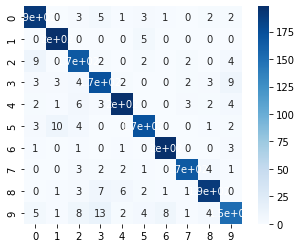

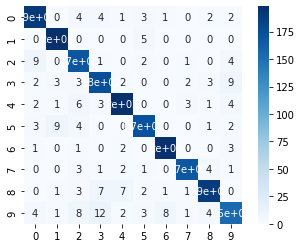

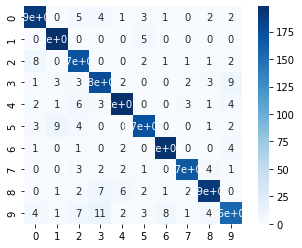

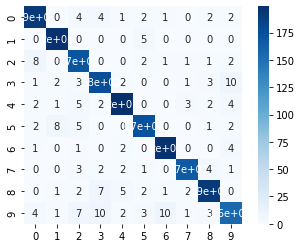

In [100]:
for i in range(10,101,10):
    model = SVC(C=i,kernel='rbf',random_state=0)
    linear_classification_train(model, features_scaled, labels, 0.2, "SVM rbf kernel c=" + str(i))

Accuracy SVM rbf kernel c=100 : 91.14 

Accuracy SVM rbf kernel c=200 : 91.49000000000001 

Accuracy SVM rbf kernel c=300 : 91.39 

Accuracy SVM rbf kernel c=400 : 91.29 

Accuracy SVM rbf kernel c=500 : 90.89 

Accuracy SVM rbf kernel c=600 : 91.03999999999999 

Accuracy SVM rbf kernel c=700 : 90.84 

Accuracy SVM rbf kernel c=800 : 90.99000000000001 

Accuracy SVM rbf kernel c=900 : 90.94 

Accuracy SVM rbf kernel c=1000 : 90.89 



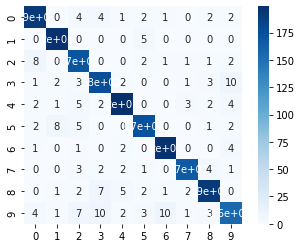

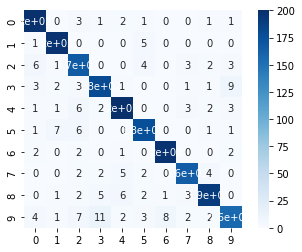

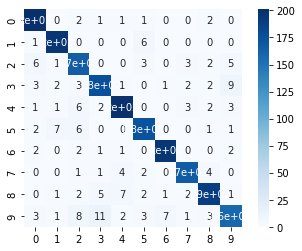

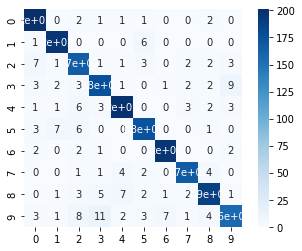

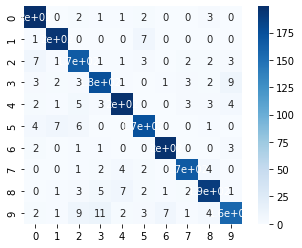

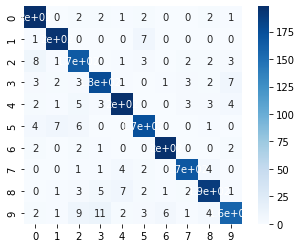

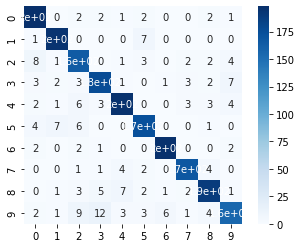

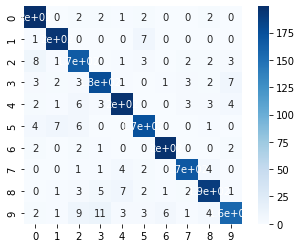

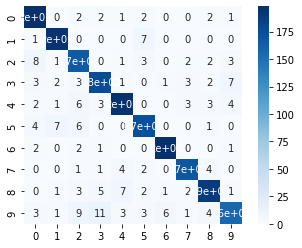

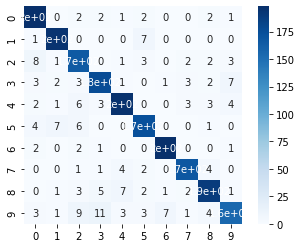

In [101]:
for i in range(100,1001,100):
    model = SVC(C=i,kernel='rbf',random_state=0)
    linear_classification_train(model, features_scaled, labels, 0.2, "SVM rbf kernel c=" + str(i))

Accuracy SVM sigmoid kernel : 14.16 



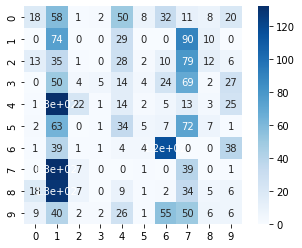

In [102]:
model = SVC(C=1.0,kernel='sigmoid',random_state=0)
linear_classification_train(model, features_scaled, labels, 0.2, "SVM sigmoid kernel")

Accuracy SVM poly d=6 kernel 0.1 : 87.24 

Accuracy SVM poly d=6 kernel 0.2 : 88.24 

Accuracy SVM poly d=6 kernel 0.3 : 88.79 

Accuracy SVM poly d=6 kernel 0.4 : 89.39 

Accuracy SVM poly d=6 kernel 0.5 : 89.79 

Accuracy SVM poly d=6 kernel 0.6 : 89.69 

Accuracy SVM poly d=6 kernel 0.7 : 89.94 

Accuracy SVM poly d=6 kernel 0.8 : 89.89 

Accuracy SVM poly d=6 kernel 0.9 : 89.74 

Accuracy SVM poly d=6 kernel 1.0 : 89.59 



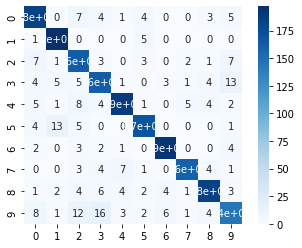

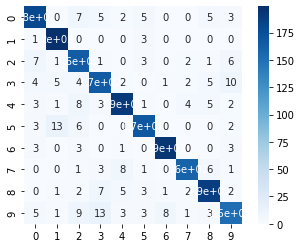

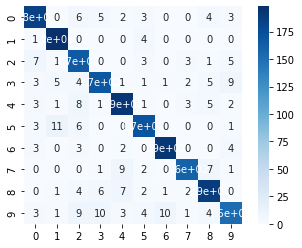

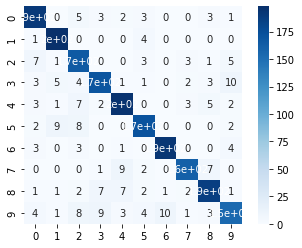

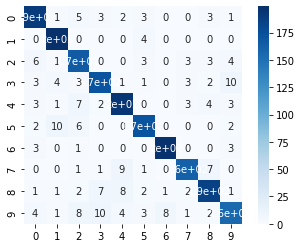

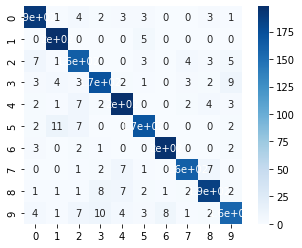

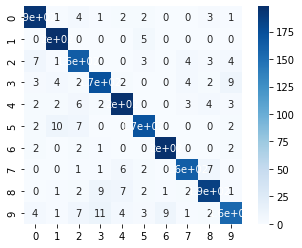

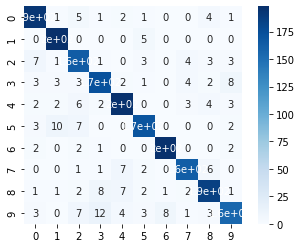

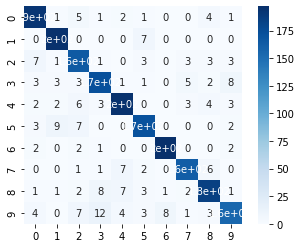

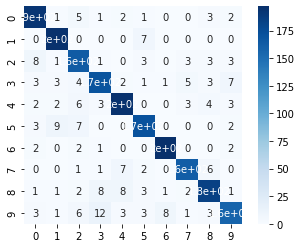

In [103]:
for i in range(1,11):
    c = i/10.0
    model = SVC(C=c,kernel='poly',degree=6,random_state=0)
    linear_classification_train(model, features_scaled, labels, 0.2, "SVM poly d=6 kernel " + str(c))

Accuracy SVM poly deg=6 kernel 1 : 89.59 

Accuracy SVM poly deg=6 kernel 2 : 90.09 

Accuracy SVM poly deg=6 kernel 3 : 89.99000000000001 



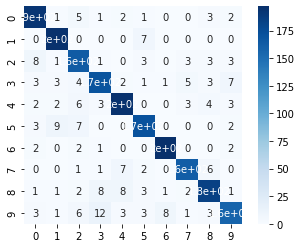

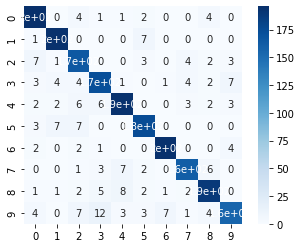

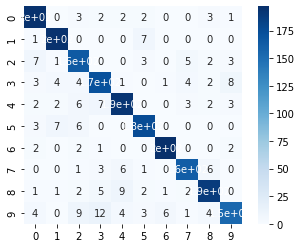

In [104]:
for i in range(1,4):
    c = i
    model = SVC(C=c,kernel='poly',degree=6,random_state=0)
    linear_classification_train(model, features_scaled, labels, 0.2, "SVM poly deg=6 kernel " + str(c))

Accuracy SVM sigmoid kernel : 76.58 



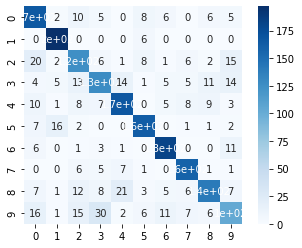

In [105]:
model = SVC(C=160,kernel='sigmoid',random_state=0,gamma=0.03)
linear_classification_train(model, features_scaled, labels, 0.2, "SVM sigmoid kernel")

(1906, 58) (1906, 1)
Accuracy SVM sigmoid kernel 0 vs rest : 87.96000000000001 

(1814, 58) (1814, 1)
Accuracy SVM sigmoid kernel 1 vs rest : 97.52 

(1851, 58) (1851, 1)
Accuracy SVM sigmoid kernel 2 vs rest : 84.64 

(1818, 58) (1818, 1)
Accuracy SVM sigmoid kernel 3 vs rest : 78.85 

(1810, 58) (1810, 1)
Accuracy SVM sigmoid kernel 4 vs rest : 85.91 

(1843, 58) (1843, 1)
Accuracy SVM sigmoid kernel 5 vs rest : 87.53 

(1849, 58) (1849, 1)
Accuracy SVM sigmoid kernel 6 vs rest : 92.7 

(1826, 58) (1826, 1)
Accuracy SVM sigmoid kernel 7 vs rest : 89.07000000000001 

(1823, 58) (1823, 1)
Accuracy SVM sigmoid kernel 8 vs rest : 84.38 

(1789, 58) (1789, 1)
Accuracy SVM sigmoid kernel 9 vs rest : 72.63 



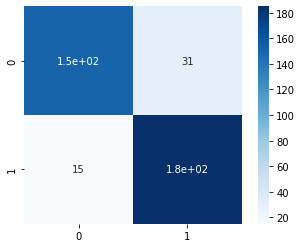

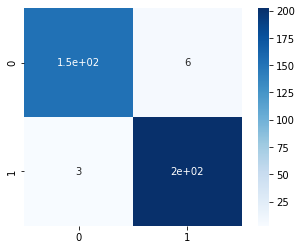

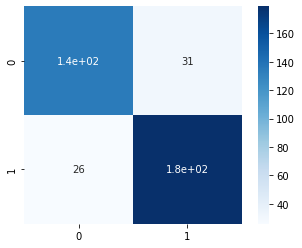

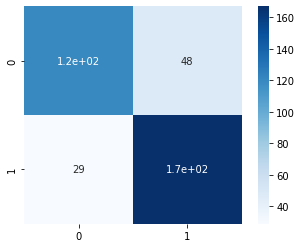

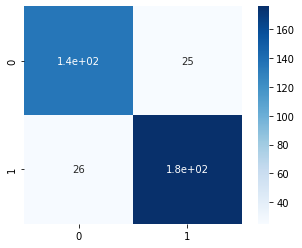

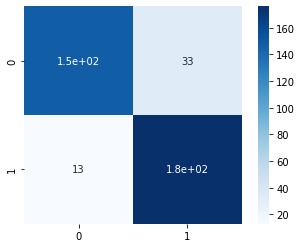

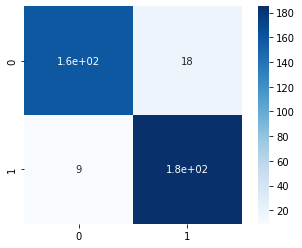

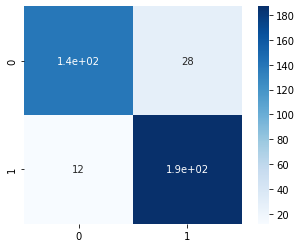

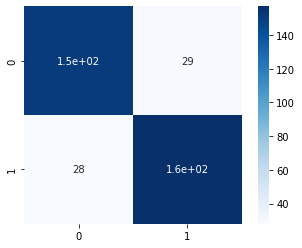

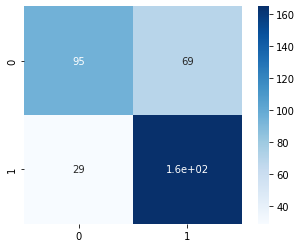

In [106]:
for i in range(0,10):
    labels1=[]
    fs1=[]
    #     labels1 = copy.deepcopy(labels)
    for j in range(len(labels)):
        if labels[j] == i:
            fs1.append(features_scaled.iloc[j,:])
            labels1.append(1)
        else :
            k = random.randint(0,10)
            if k == 1:
                fs1.append(features_scaled.iloc[j])
                labels1.append(0)
    fs1 = pd.DataFrame(fs1)
    labels1 = np.array(pd.DataFrame(labels1))
    print(fs1.shape,labels1.shape)
    model = SVC(C=130,kernel='sigmoid',random_state=0,gamma=0.04)
    linear_classification_train(model, fs1, labels1, 0.2, "SVM sigmoid kernel " + str(i) + " vs rest")

Accuracy SVM rbf kernel c=200  : 91.49000000000001 



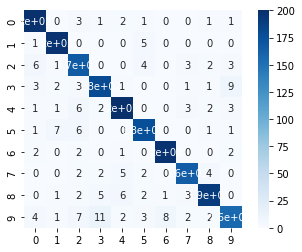

In [107]:
model = SVC(C=200,kernel='rbf',random_state=0)
linear_classification_train(model, features_scaled, labels, 0.2, "SVM rbf kernel c=200 ")

Accuracy SVM rbf kernel c=200 gamma=0.01 : 77.08 

Accuracy SVM rbf kernel c=200 gamma=0.02 : 78.58000000000001 

Accuracy SVM rbf kernel c=200 gamma=0.03 : 79.53 

Accuracy SVM rbf kernel c=200 gamma=0.04 : 81.13 

Accuracy SVM rbf kernel c=200 gamma=0.05 : 82.48 

Accuracy SVM rbf kernel c=200 gamma=0.06 : 83.67999999999999 

Accuracy SVM rbf kernel c=200 gamma=0.07 : 84.78 

Accuracy SVM rbf kernel c=200 gamma=0.08 : 85.54 

Accuracy SVM rbf kernel c=200 gamma=0.09 : 86.19 

Accuracy SVM rbf kernel c=200 gamma=0.1 : 86.64 

Accuracy SVM rbf kernel c=200 gamma=0.2 : 90.03999999999999 

Accuracy SVM rbf kernel c=200 gamma=0.3 : 91.39 

Accuracy SVM rbf kernel c=200 gamma=0.4 : 91.79 

Accuracy SVM rbf kernel c=200 gamma=0.5 : 91.69 

Accuracy SVM rbf kernel c=200 gamma=0.6 : 91.84 

Accuracy SVM rbf kernel c=200 gamma=0.7 : 92.34 

Accuracy SVM rbf kernel c=200 gamma=0.8 : 92.44 

Accuracy SVM rbf kernel c=200 gamma=0.9 : 92.64 

Accuracy SVM rbf kernel c=200 gamma=1.0 : 92.94 



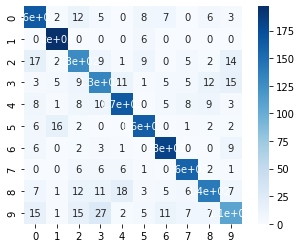

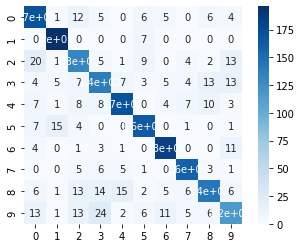

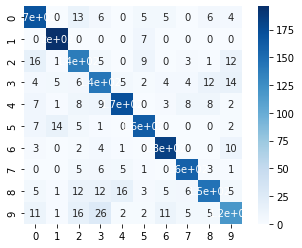

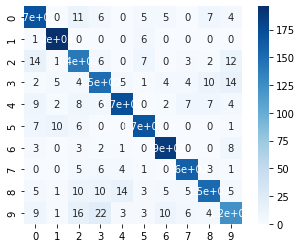

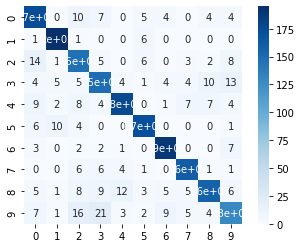

...

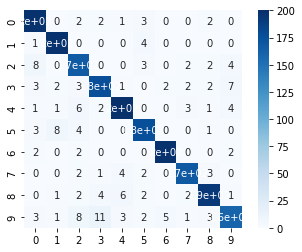

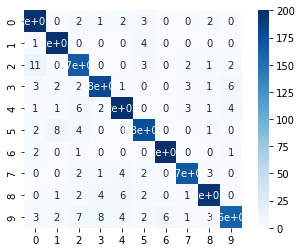

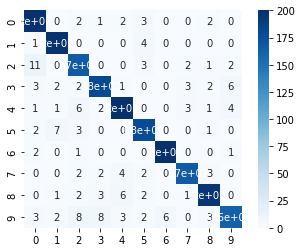

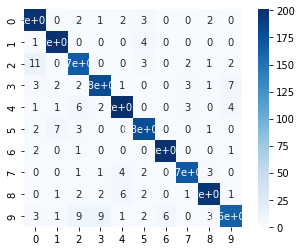

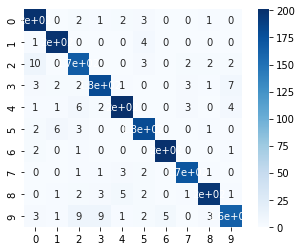

In [108]:
for i in range(1,10):
    model = SVC(C=200,kernel='rbf',random_state=0,gamma=i/100)
    linear_classification_train(model, features_scaled, labels, 0.2, "SVM rbf kernel c=200 gamma=" + str(i/100))
for i in range(1,11):
    model = SVC(C=200,kernel='rbf',random_state=0,gamma=i/10)
    linear_classification_train(model, features_scaled, labels, 0.2, "SVM rbf kernel c=200 gamma=" + str(i/10))

Accuracy SVM rbf kernel c=200 gamma=1 : 92.94 

Accuracy SVM rbf kernel c=200 gamma=2 : 94.04 

Accuracy SVM rbf kernel c=200 gamma=3 : 94.44 

Accuracy SVM rbf kernel c=200 gamma=4 : 94.24 

Accuracy SVM rbf kernel c=200 gamma=5 : 93.89 

Accuracy SVM rbf kernel c=200 gamma=6 : 93.54 

Accuracy SVM rbf kernel c=200 gamma=7 : 92.94 

Accuracy SVM rbf kernel c=200 gamma=8 : 92.19000000000001 

Accuracy SVM rbf kernel c=200 gamma=9 : 91.84 

Accuracy SVM rbf kernel c=200 gamma=10 : 90.99000000000001 



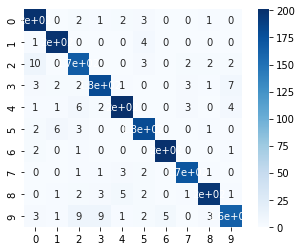

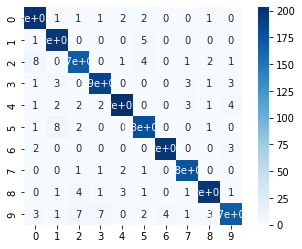

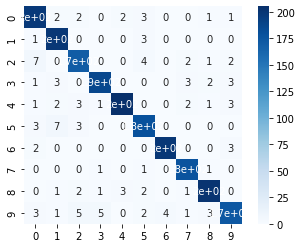

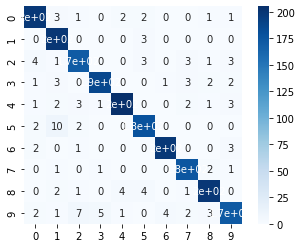

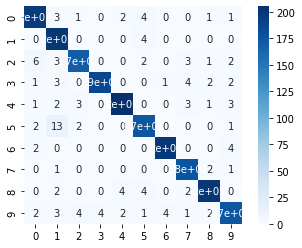

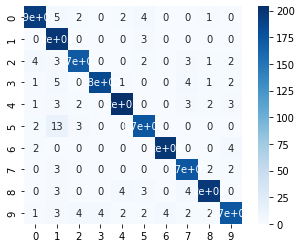

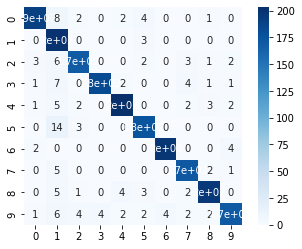

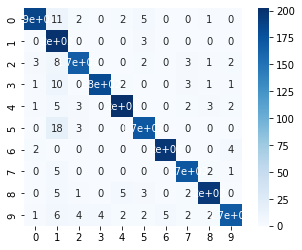

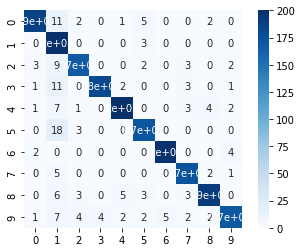

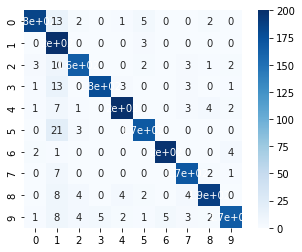

In [109]:
for i in range(1,11):
    model = SVC(C=200,kernel='rbf',random_state=0,gamma=i)
    linear_classification_train(model, features_scaled, labels, 0.2, "SVM rbf kernel c=200 gamma=" + str(i))

Accuracy SVM rbf kernel c=200 gamma=3 : 94.44 



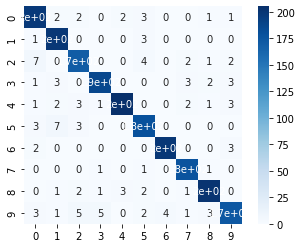

In [110]:
model = SVC(C=200,kernel='rbf',random_state=0,gamma=3)
linear_classification_train(model, features_scaled, labels, 0.2, "SVM rbf kernel c=200 gamma=" + str(3))

In [111]:
model.get_params(deep = True)


{'C': 200,
 'break_ties': False,
 'cache_size': 200,
 'class_weight': None,
 'coef0': 0.0,
 'decision_function_shape': 'ovr',
 'degree': 3,
 'gamma': 3,
 'kernel': 'rbf',
 'max_iter': -1,
 'probability': False,
 'random_state': 0,
 'shrinking': True,
 'tol': 0.001,
 'verbose': False}

### View Data

In [112]:
# Sample rate
sr = 45600

# Normalize function for Spectral rolloff
def normalize(x, axis=0):
    return sklearn.preprocessing.minmax_scale(x, axis=axis)

# Start and End for Zero Crossing-Rate
start = 1000
end = 1200

In [114]:
blues_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/blues/blues.00000.wav'
classical_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/classical/classical.00000.wav'
country_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/country/country.00000.wav'
disco_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/disco/disco.00000.wav'
hipHop_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/hiphop/hiphop.00000.wav'
jazz_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/jazz/jazz.00000.wav'
metal_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/metal/metal.00000.wav'
pop_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/pop/pop.00000.wav'
raggae_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/reggae/reggae.00000.wav'
rock_sample = r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data/genres_original/rock/rock.00000.wav'

Load one song from each genre

In [115]:
# BLUES
data_blues, sr = librosa.load(blues_sample, sr=sr)
    # CLASSICAL
data_classical, sr = librosa.load(classical_sample, sr=sr)
    # COUNTRY
data_country, sr = librosa.load(country_sample, sr=sr)
    # DISCO
data_disco, sr = librosa.load(disco_sample, sr=sr)
    # HIP HOP
data_hipHop, sr = librosa.load(hipHop_sample, sr=sr)
    # JAZZ
data_jazz, sr = librosa.load(jazz_sample, sr=sr)
    # METAL
data_metal, sr = librosa.load(metal_sample, sr=sr)
    # POP
data_pop, sr = librosa.load(pop_sample, sr=sr)
    # RAGGAE
data_raggae, sr = librosa.load(raggae_sample, sr=sr)
    # ROCK
data_rock, sr = librosa.load(rock_sample, sr=sr)

songs = {
    'BLUES': data_blues,
    'CLASSICAL': data_classical,
    'COUNTRY': data_country,
    'DISCO': data_disco,
    'HIP HOP': data_hipHop,
    'JAZZ': data_jazz,
    'METAL': data_metal,
    'POP': data_pop,
    'RAGGAE': data_raggae,
    'ROCK': data_rock
}

Vizualizing audio files¶


In [117]:
import librosa.display as lpt

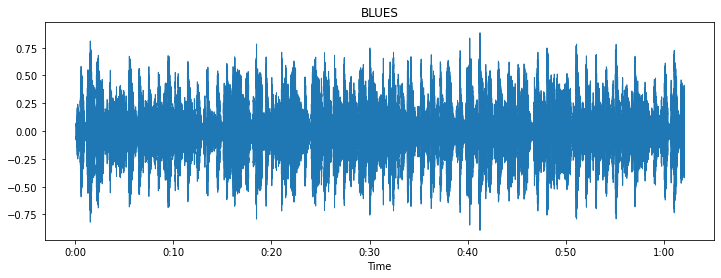

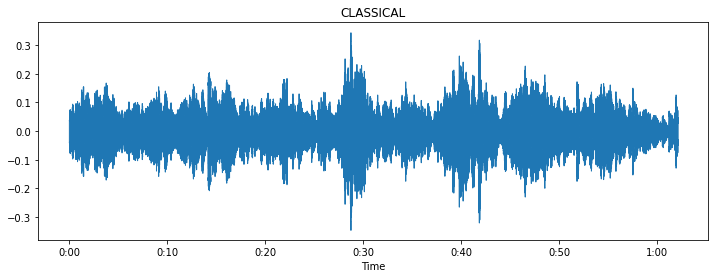

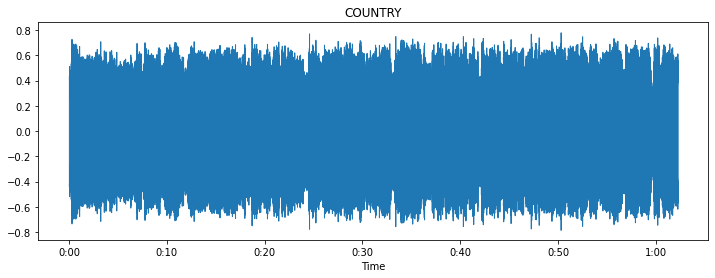

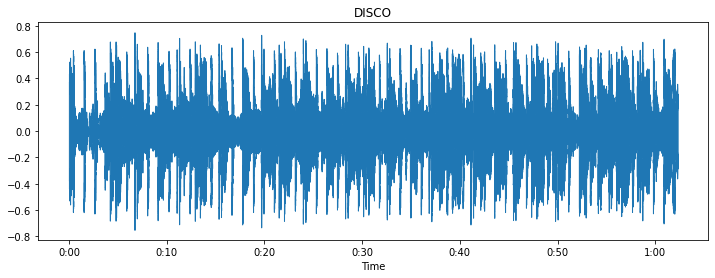

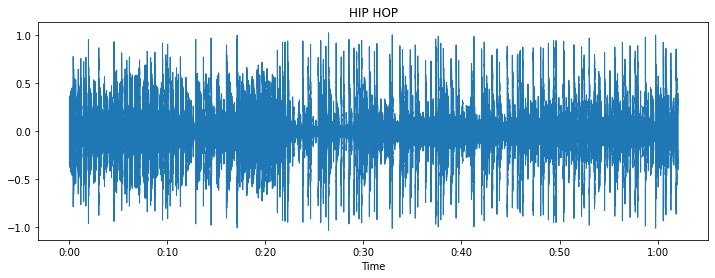

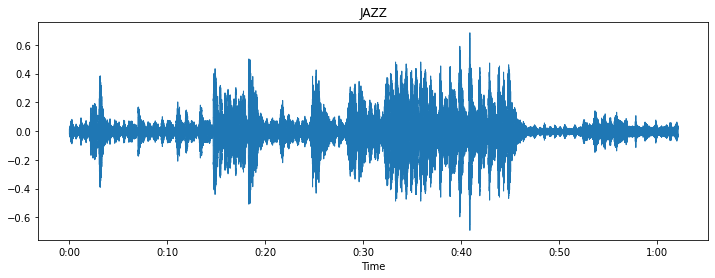

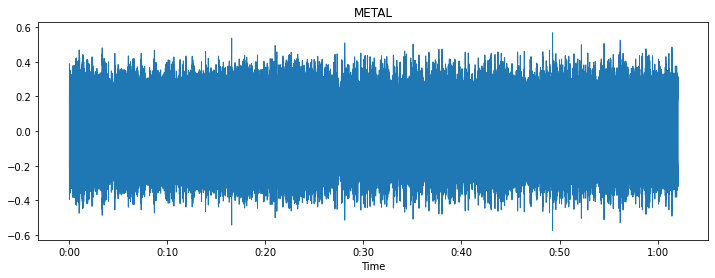

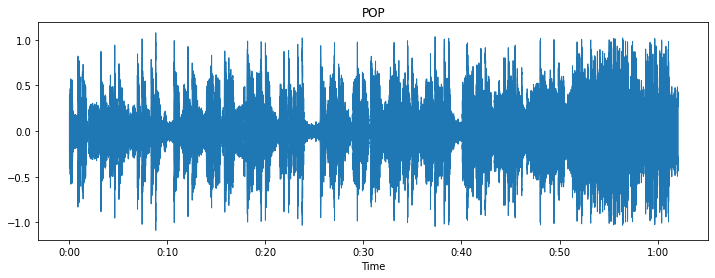

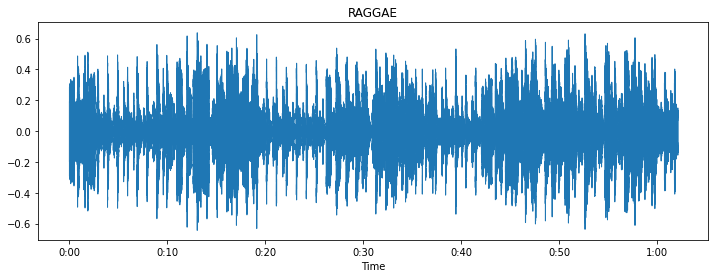

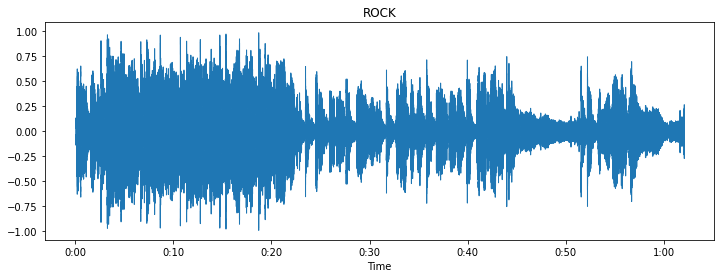

In [119]:
for genre, song in songs.items():
    plt.figure(figsize=(12, 4))
    lpt.waveshow(song)
    plt.title(genre)

Spectrograms
* Normal spectrograms

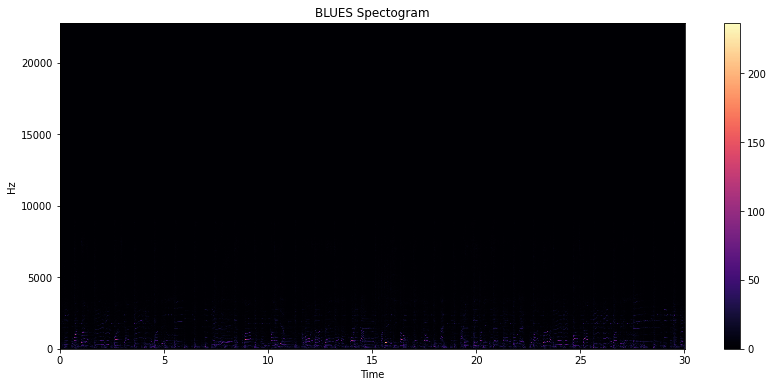

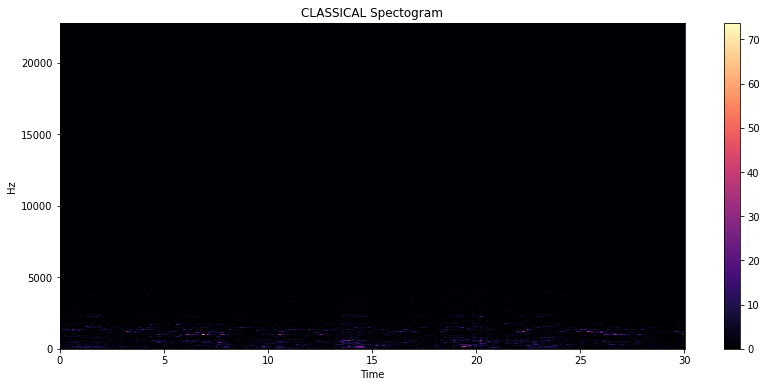

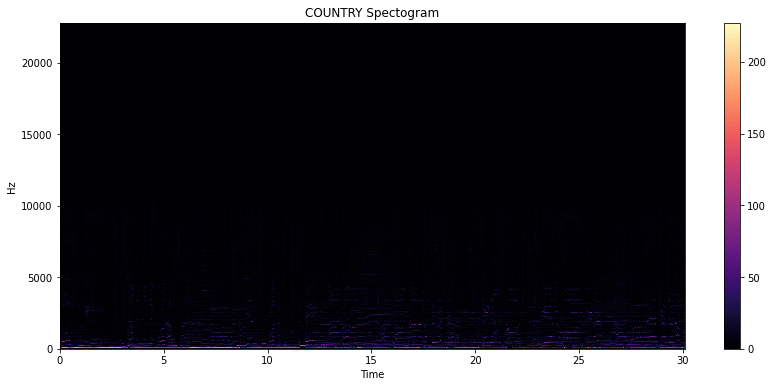

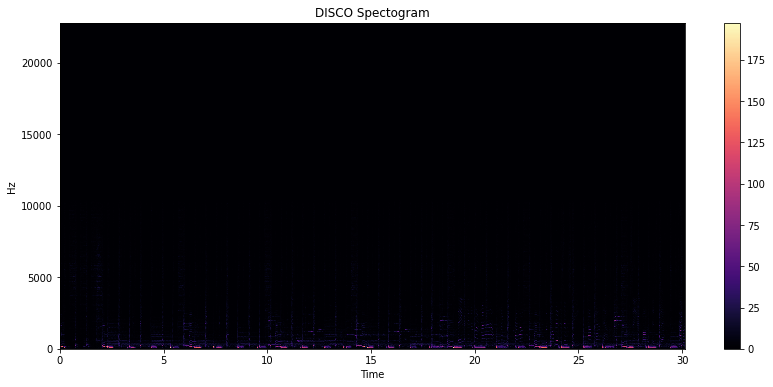

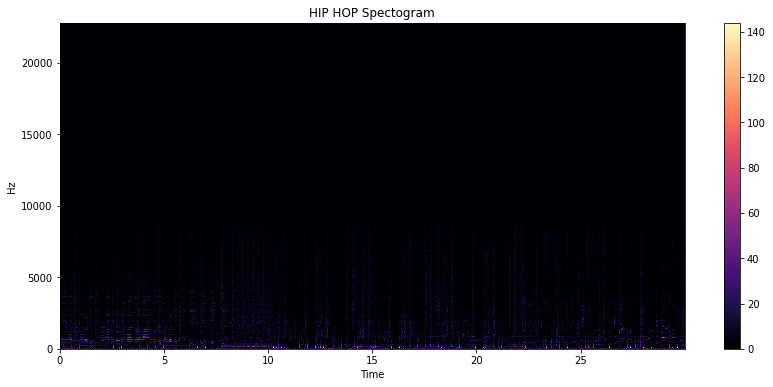

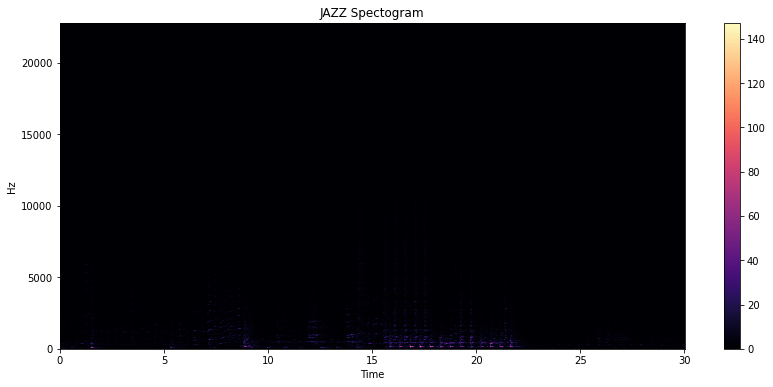

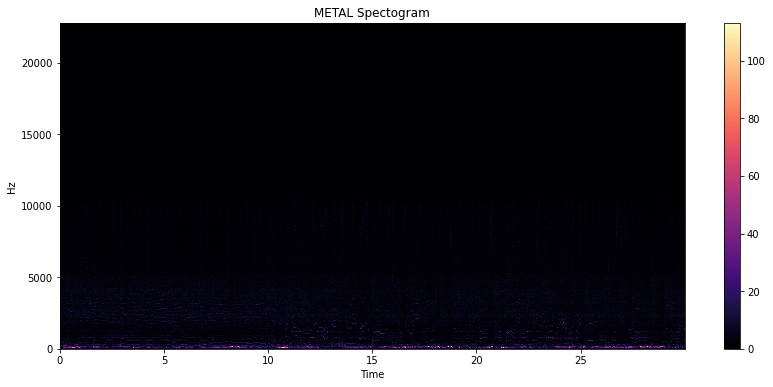

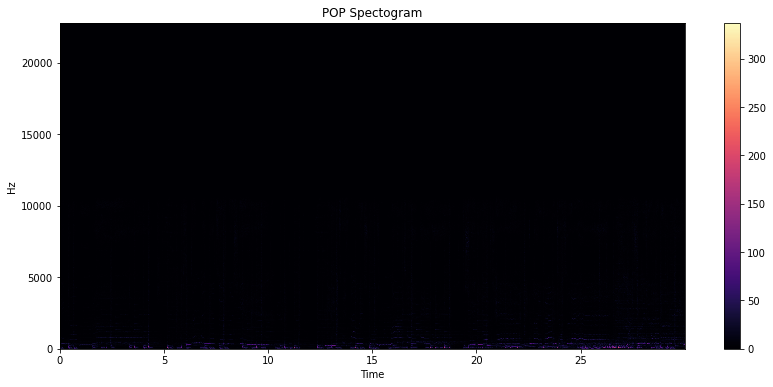

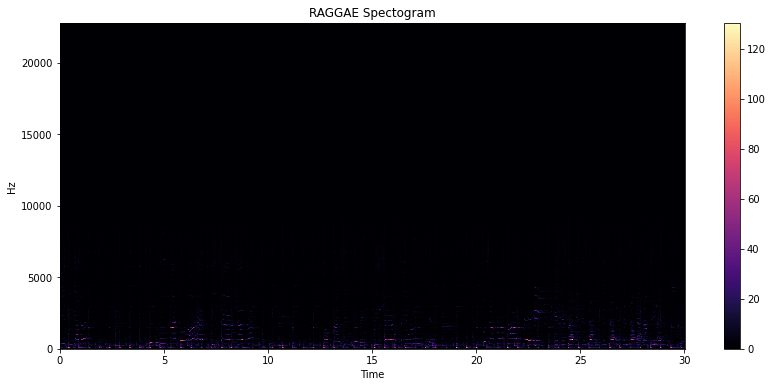

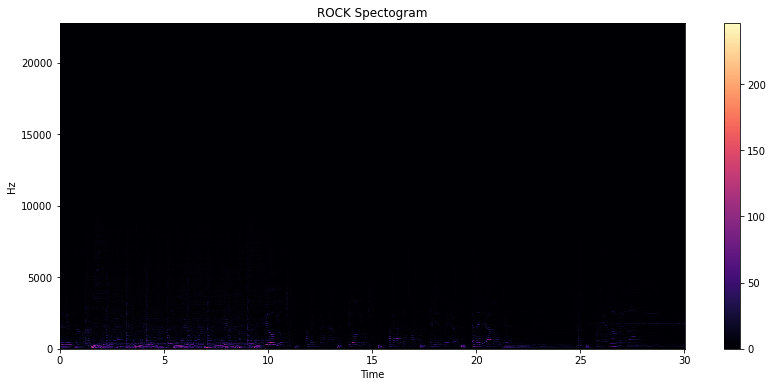

In [120]:
for genre, song in songs.items():
    stft = librosa.stft(song)
    plt.figure(figsize=(14, 6))
    lpt.specshow(stft, sr=sr, x_axis='time', y_axis='hz')
    plt.title(genre + ' Spectogram')
    plt.colorbar()

Mel Spectogram dB


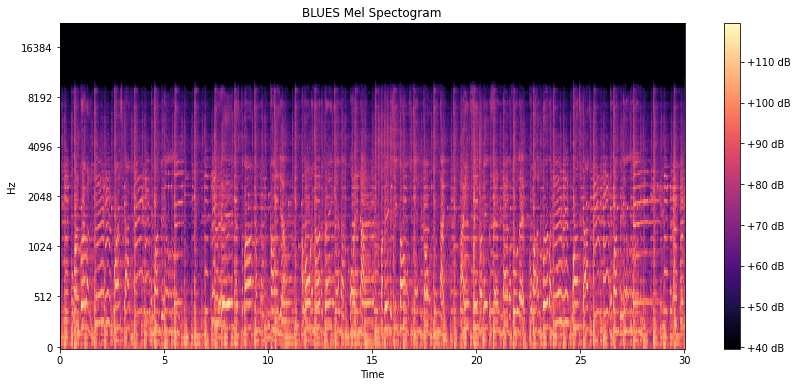

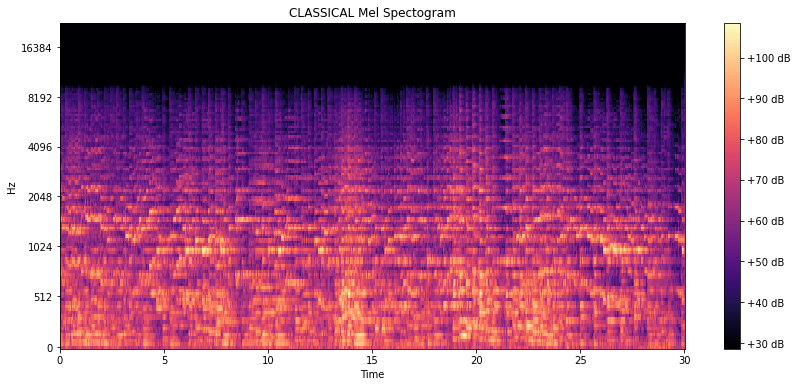

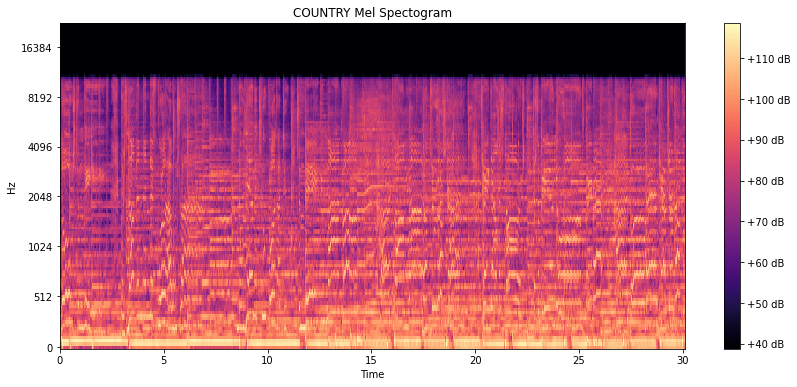

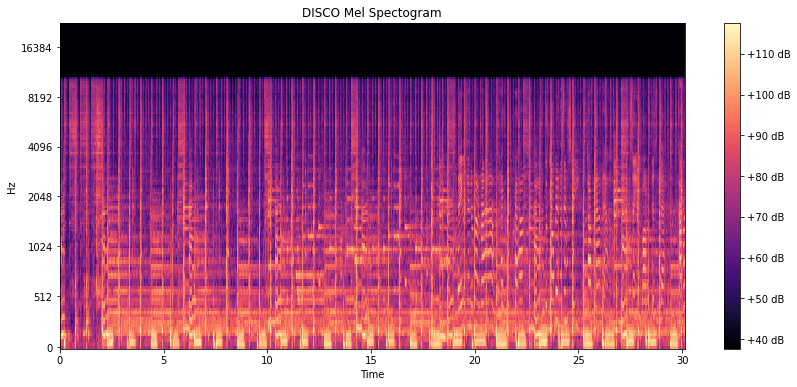

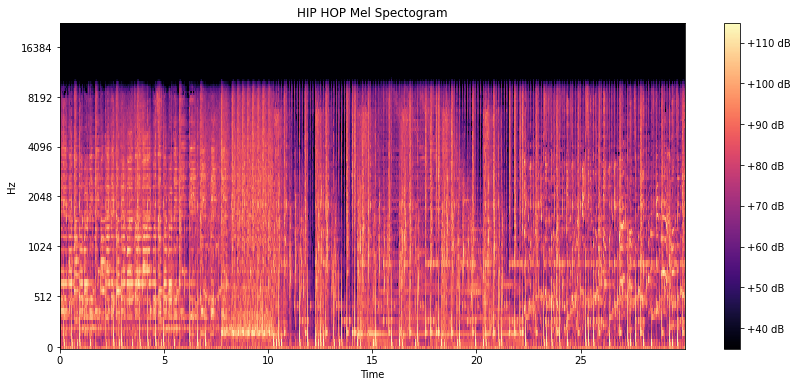

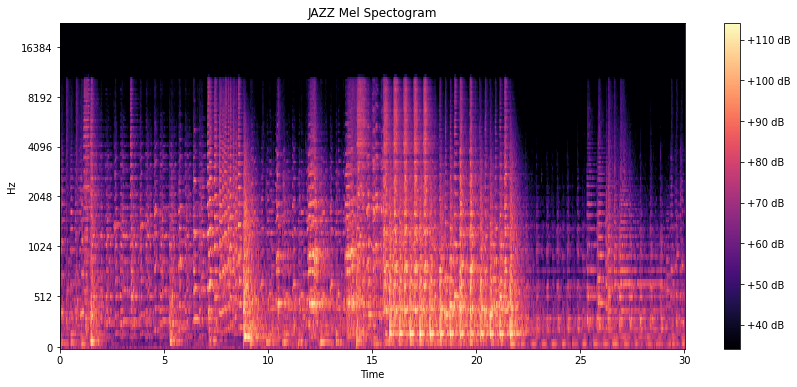

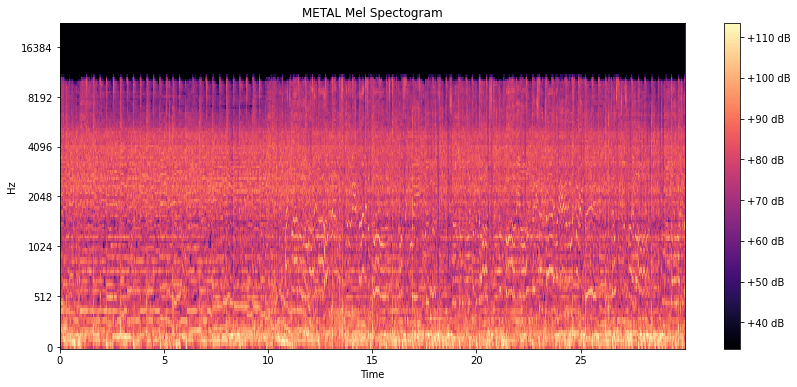

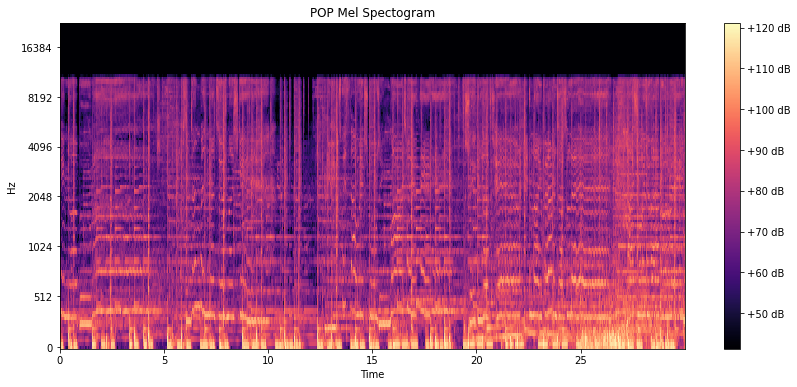

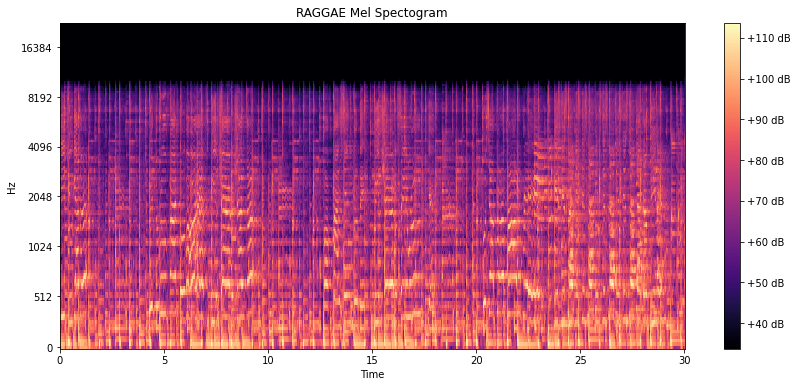

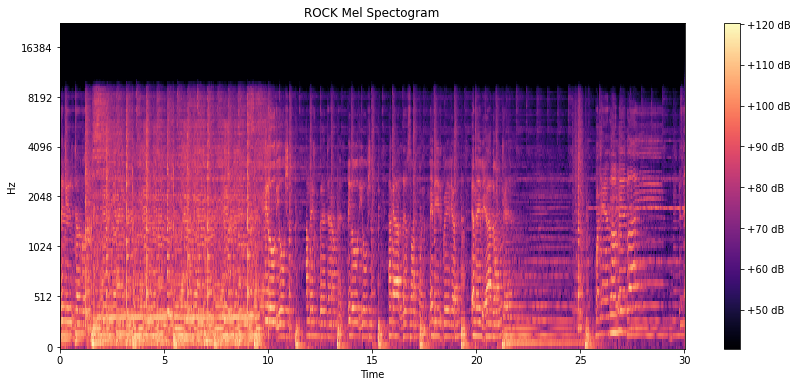

In [121]:
for genre, song in songs.items():
    stft = librosa.stft(song)
    magphase, _ = librosa.magphase(stft)
    mel_scale_sgram = librosa.feature.melspectrogram(S=magphase, sr=sr)
    mel_sgram = librosa.amplitude_to_db(mel_scale_sgram, ref=np.min)
    plt.figure(figsize=(14, 6))
    librosa.display.specshow(mel_sgram, sr=sr, x_axis='time', y_axis='mel')
    plt.title(genre + ' Mel Spectogram')
    plt.colorbar(format='%+2.0f dB')

Spectral Rollof


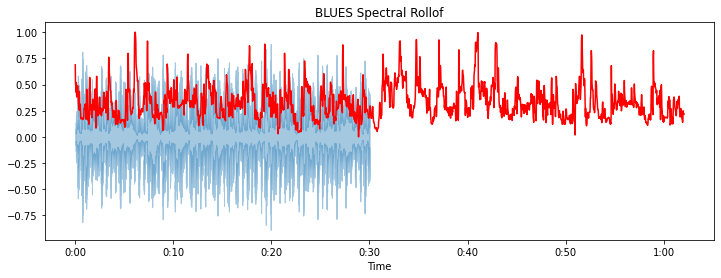

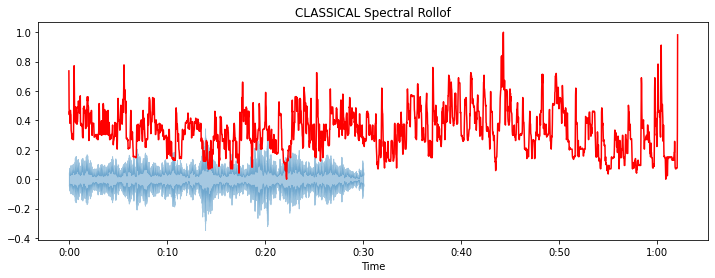

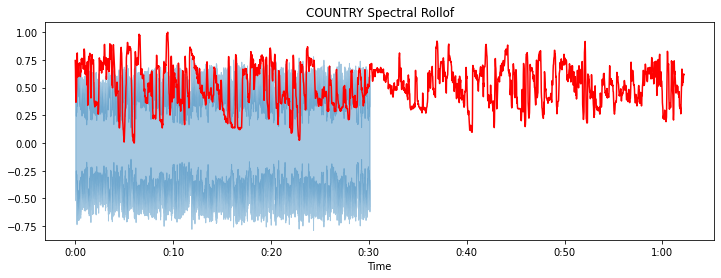

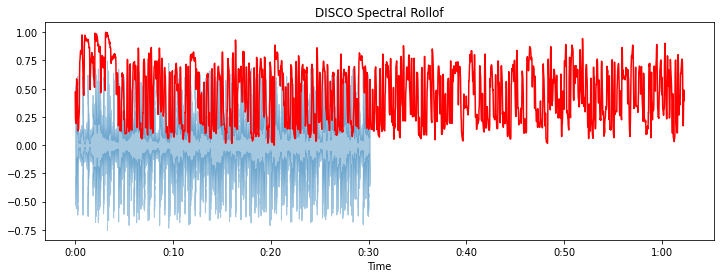

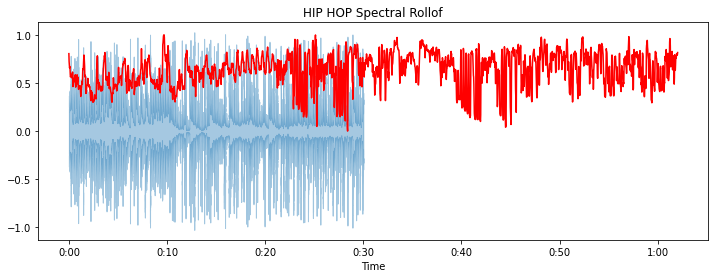

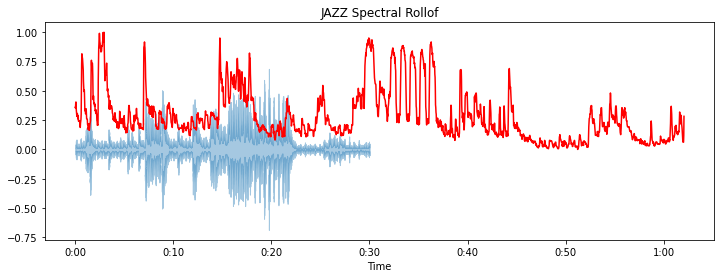

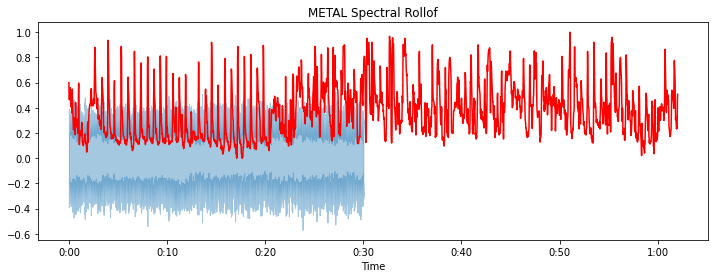

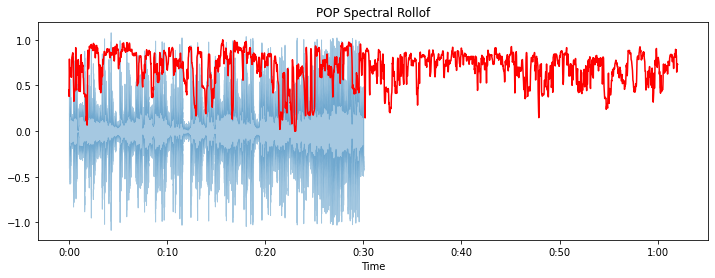

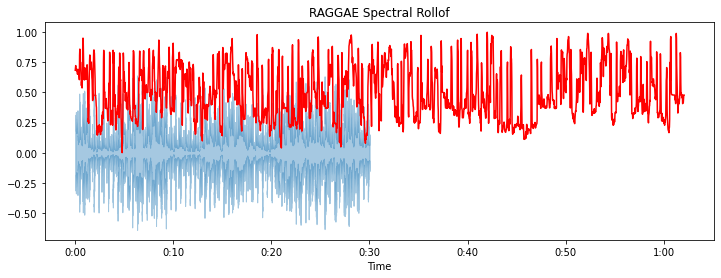

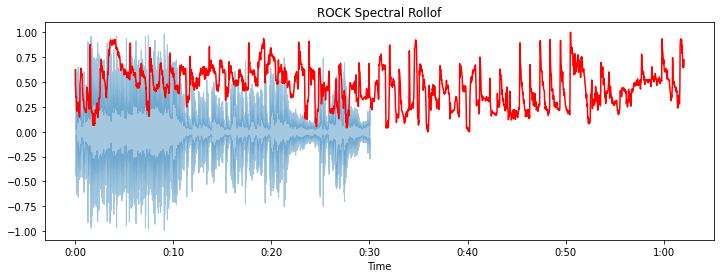

In [123]:
for genre, song in songs.items():
    spectral_centroids = librosa.feature.spectral_centroid(song, sr=sr)[0]
    t = librosa.frames_to_time(range(len(spectral_centroids)))
    spectral_rollof = librosa.feature.spectral_rolloff(song+0.01, sr=sr)[0]
    plt.figure(figsize=(12, 4))
    lpt.waveshow(song, sr=sr, alpha=0.4)
    plt.plot(t, normalize(spectral_rollof), color='r')
    plt.title(genre + ' Spectral Rollof')

Chroma Feature


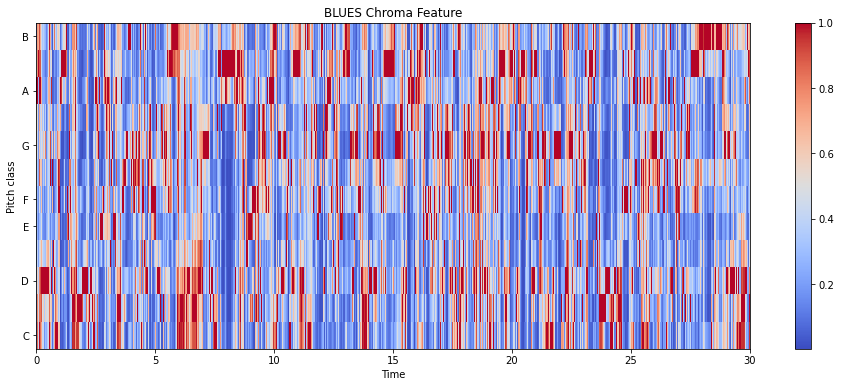

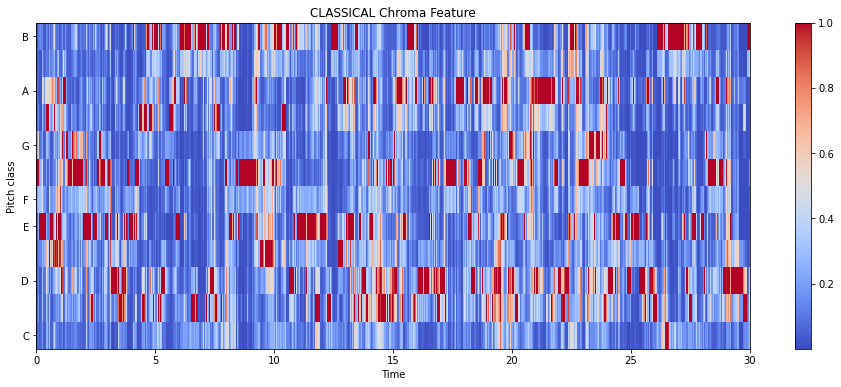

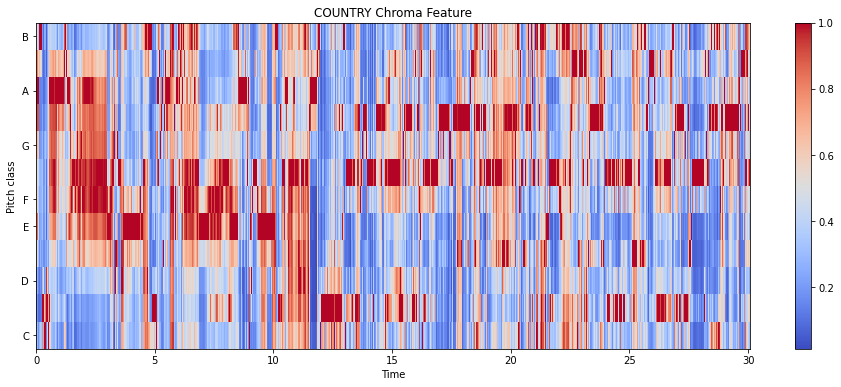

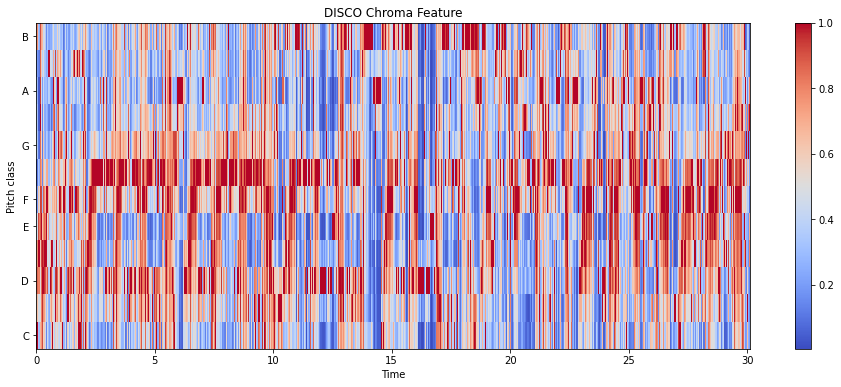

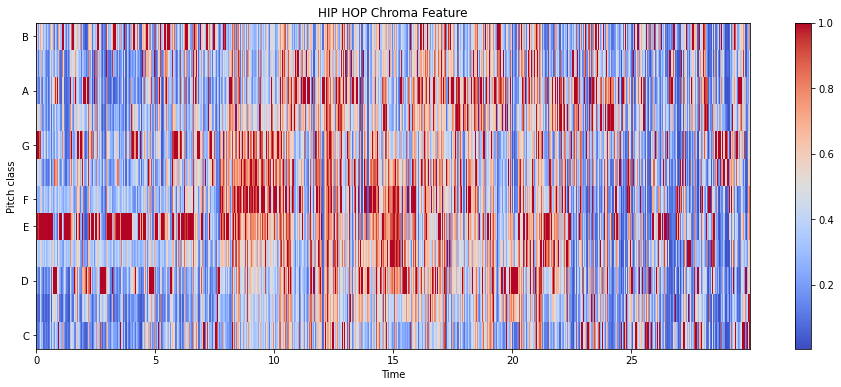

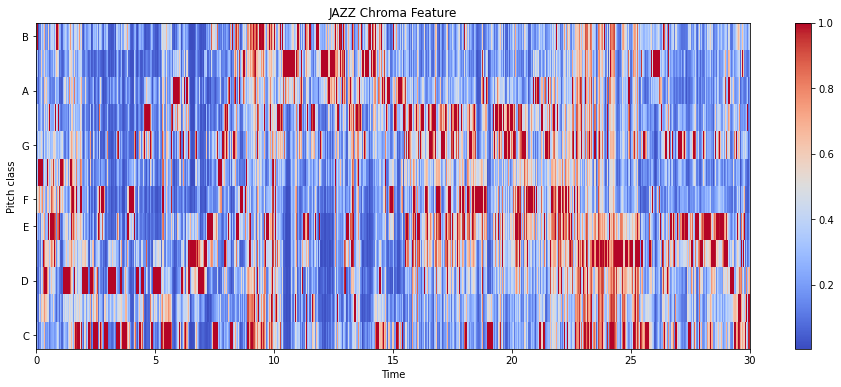

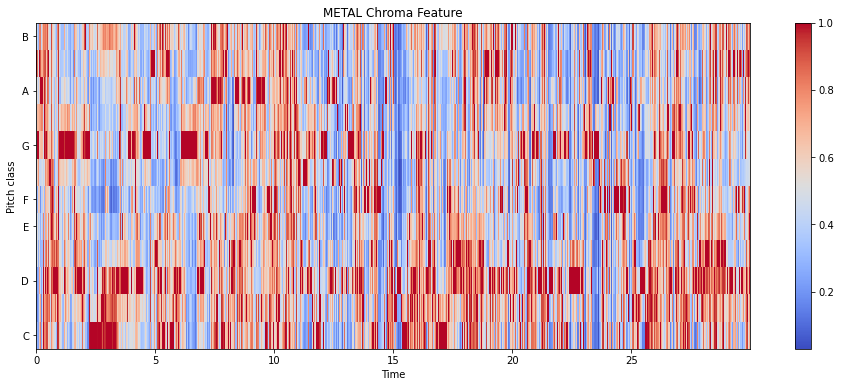

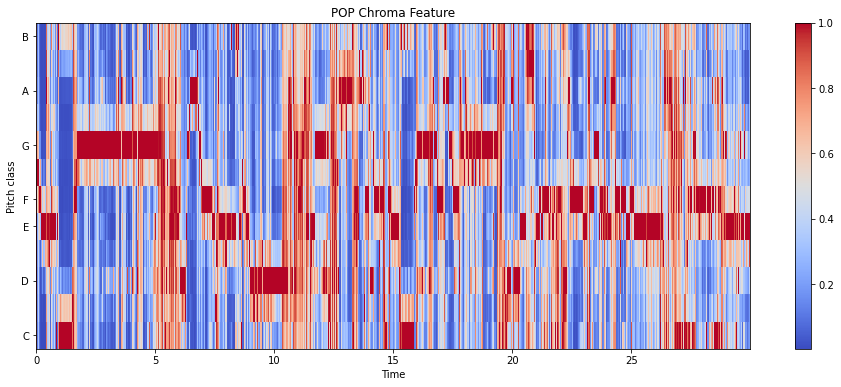

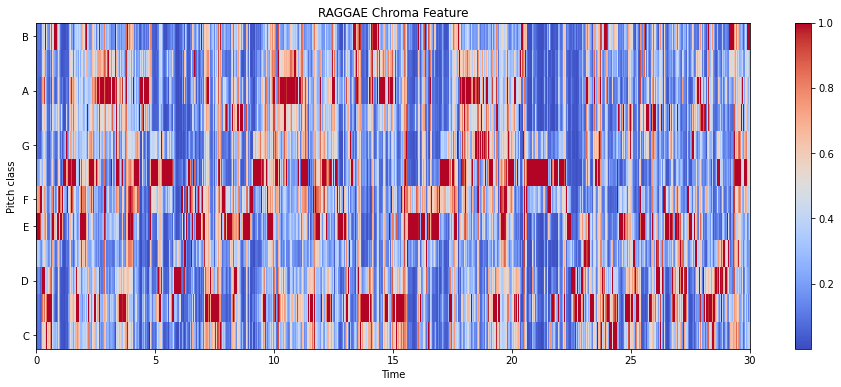

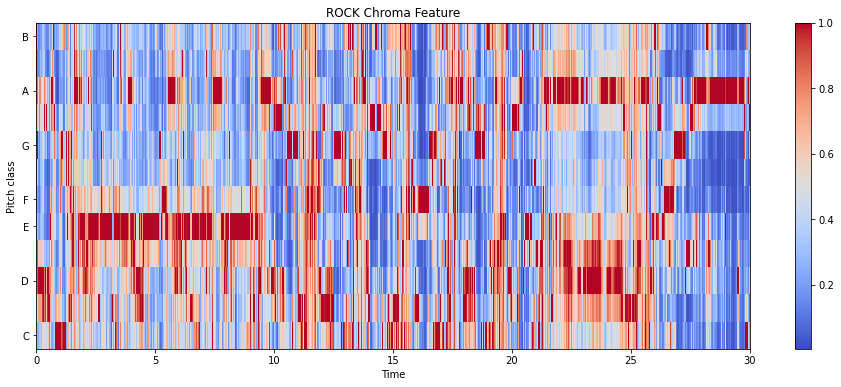

In [124]:
for genre, song in songs.items():
    chroma = librosa.feature.chroma_stft(song, sr=sr)
    plt.figure(figsize=(16, 6))
    lpt.specshow(chroma, sr=sr, x_axis='time', y_axis='chroma', cmap='coolwarm')
    plt.colorbar()
    plt.title(genre + ' Chroma Feature')

Zero Crossing-Rate


Zero crossings BLUES: 15
Zero crossings CLASSICAL: 13
Zero crossings COUNTRY: 3
Zero crossings DISCO: 10
Zero crossings HIP HOP: 21
Zero crossings JAZZ: 13
Zero crossings METAL: 31
Zero crossings POP: 0
Zero crossings RAGGAE: 10
Zero crossings ROCK: 8


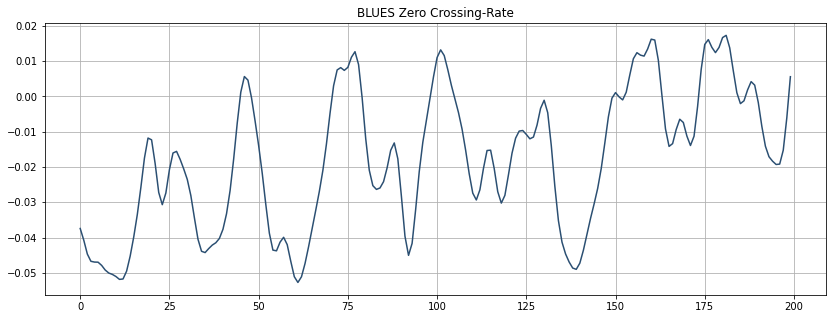

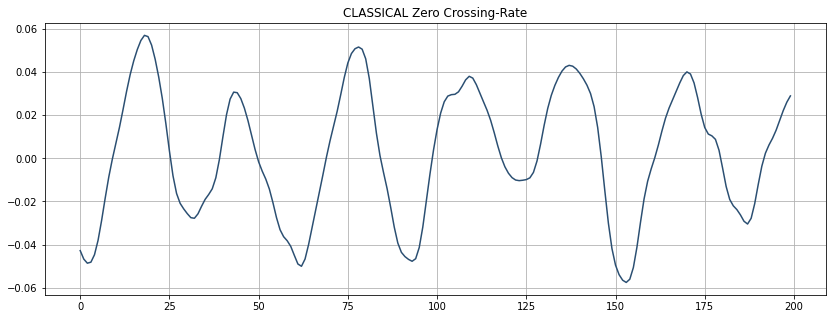

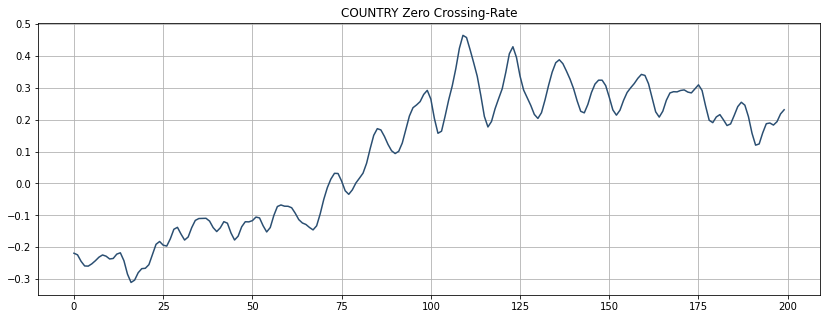

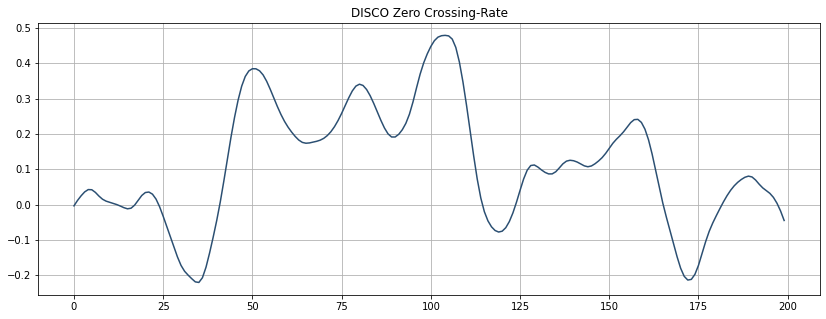

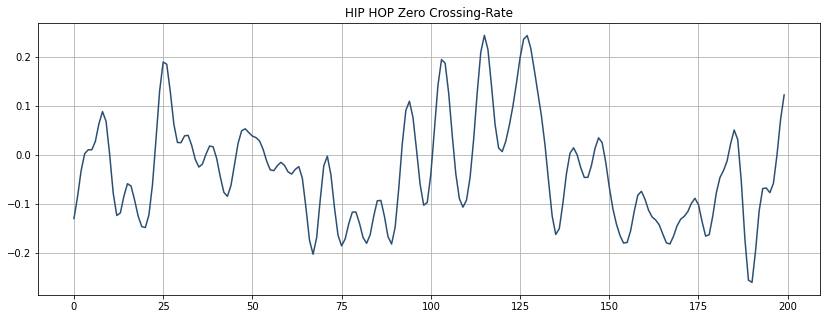

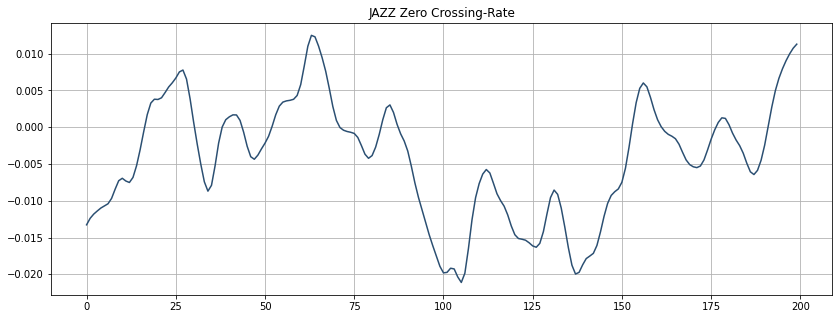

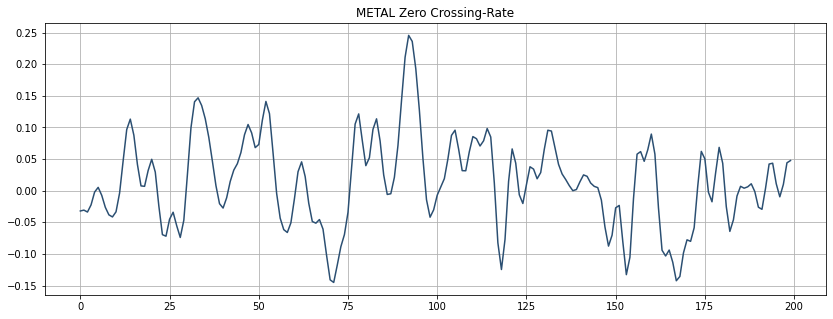

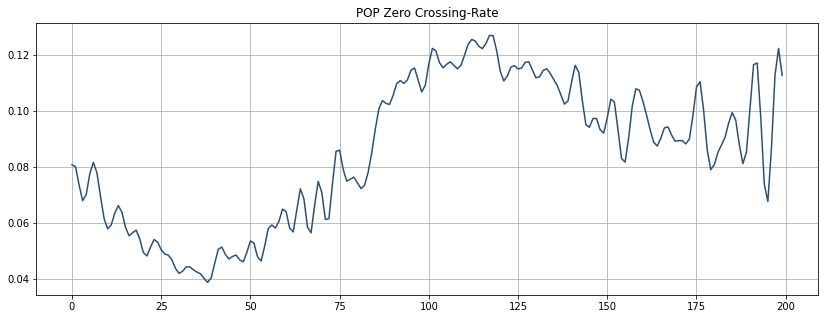

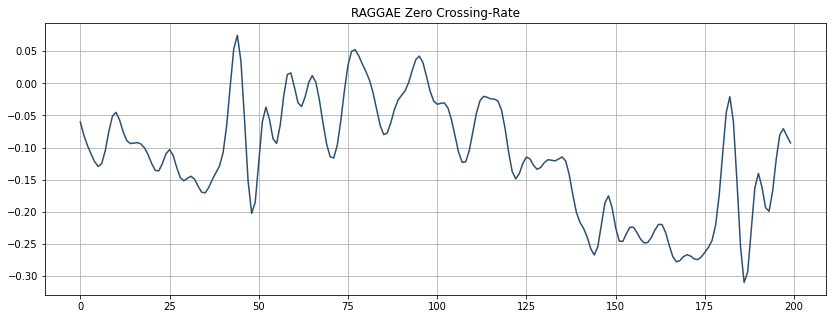

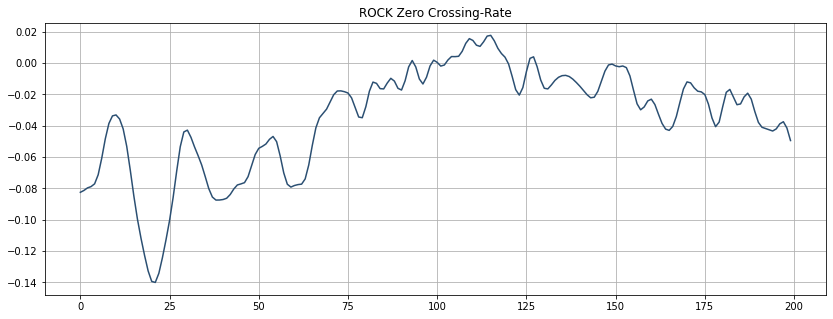

In [125]:
for genre, song in songs.items():
    plt.figure(figsize=(14, 5))
    plt.plot(song[start:end], color='#2B4F72')
    plt.title(genre + ' Zero Crossing-Rate')
    plt.grid()
    zero_crossings = librosa.zero_crossings(song[start:end], pad=False)
    print('Zero crossings ' + genre + ':', sum(zero_crossings))

Spectral Centroids


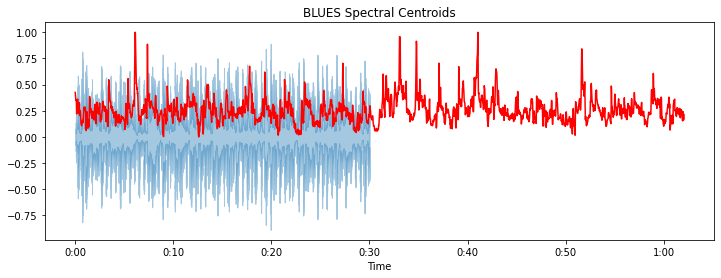

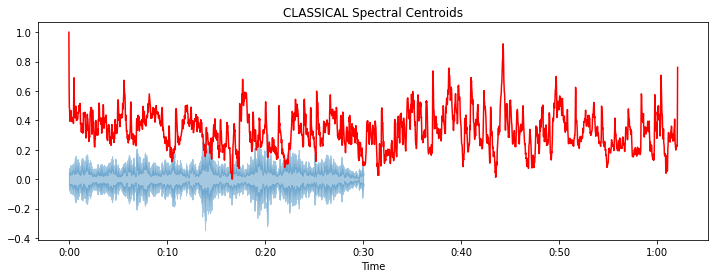

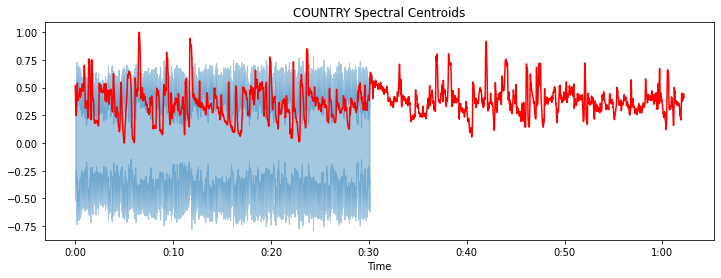

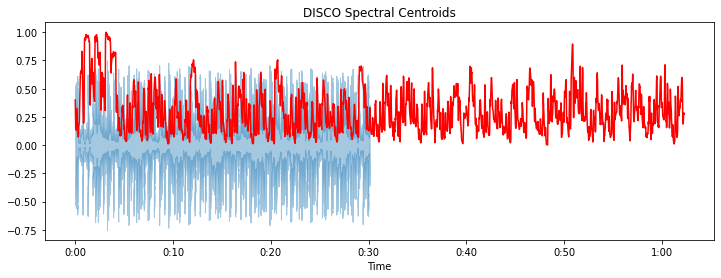

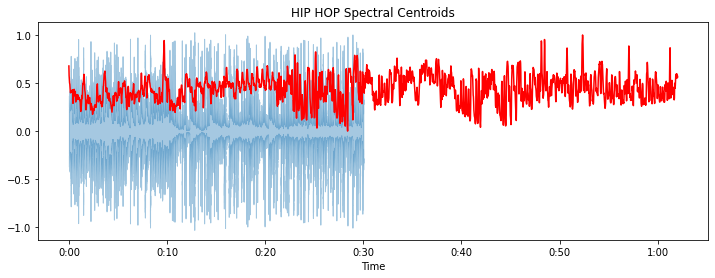

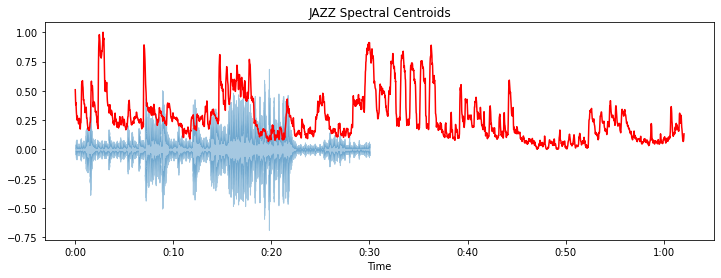

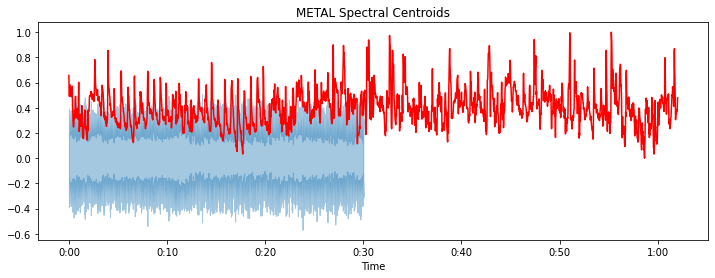

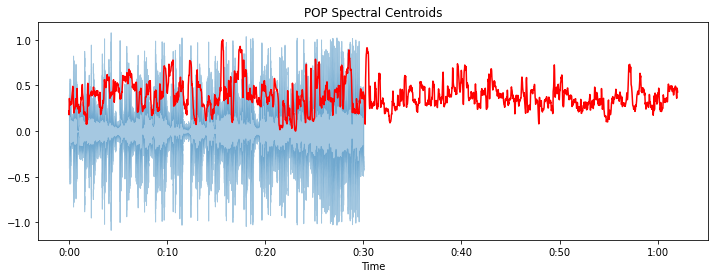

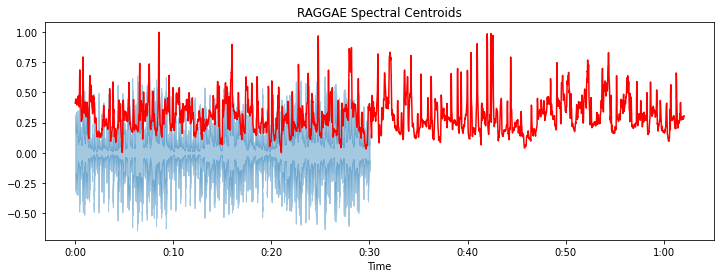

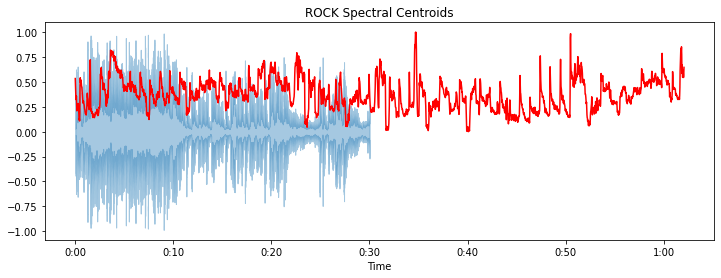

In [127]:
for genre, song in songs.items():
    spectral_centroids = librosa.feature.spectral_centroid(song, sr=sr)[0]
    t = librosa.frames_to_time(range(len(spectral_centroids)))
    plt.figure(figsize=(12,4))
    lpt.waveshow(song, sr=sr, alpha=0.4)
    plt.plot(t, normalize(spectral_centroids), color='r')
    plt.title(genre + ' Spectral Centroids')

(20, 2674)
(20, 2674)
(20, 2680)
(20, 2683)
(20, 2672)
(20, 2674)
(20, 2672)
(20, 2672)
(20, 2674)
(20, 2674)


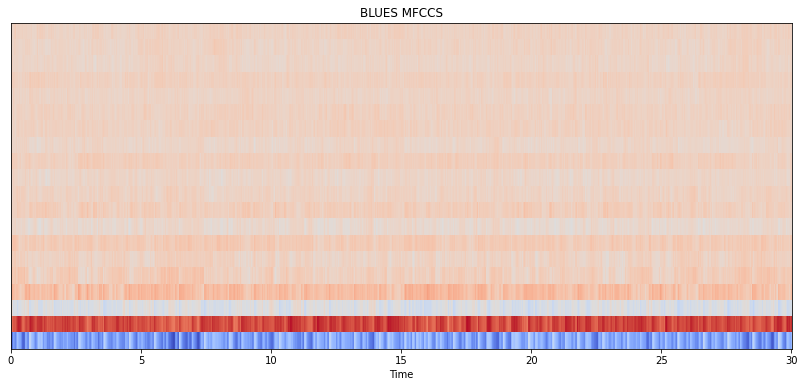

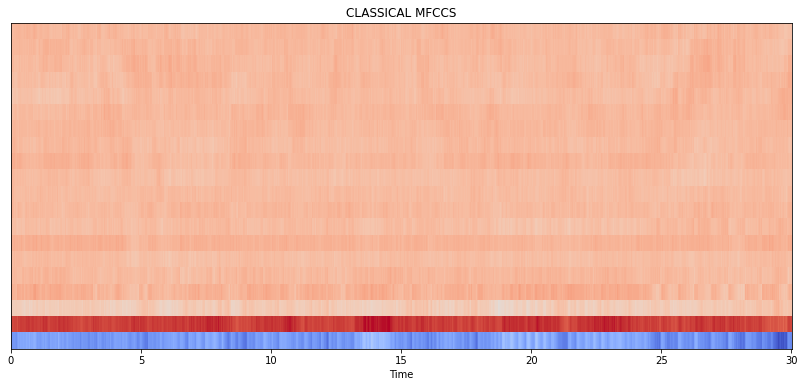

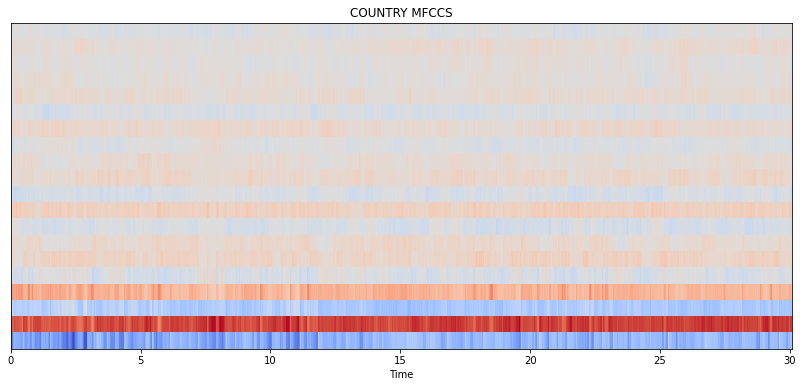

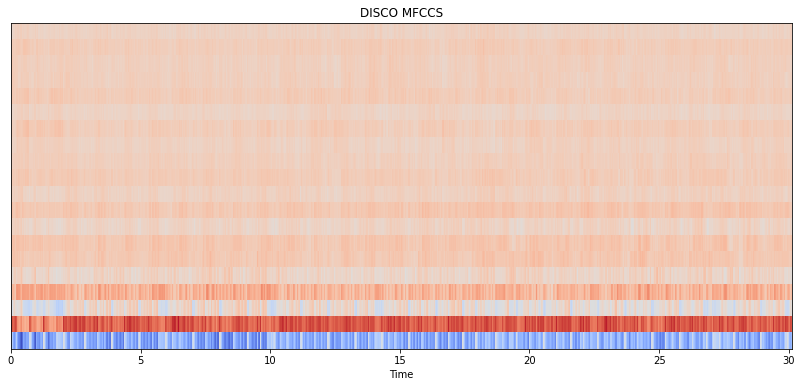

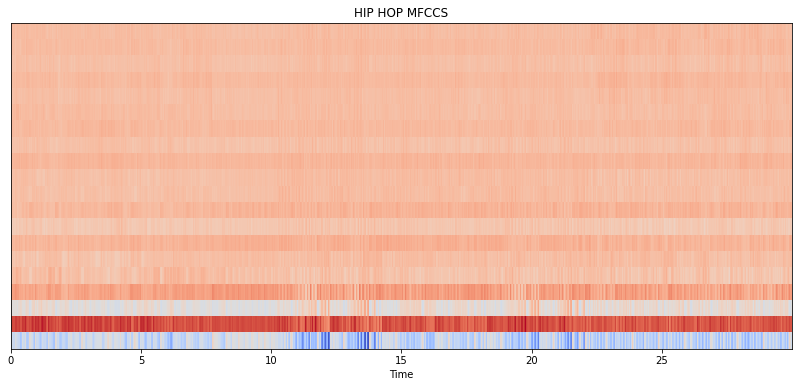

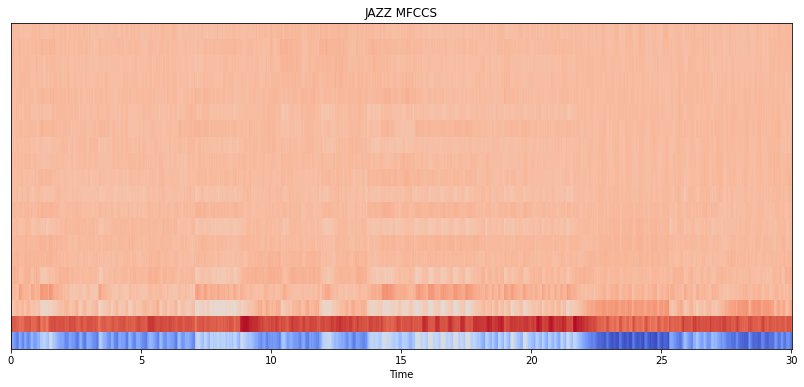

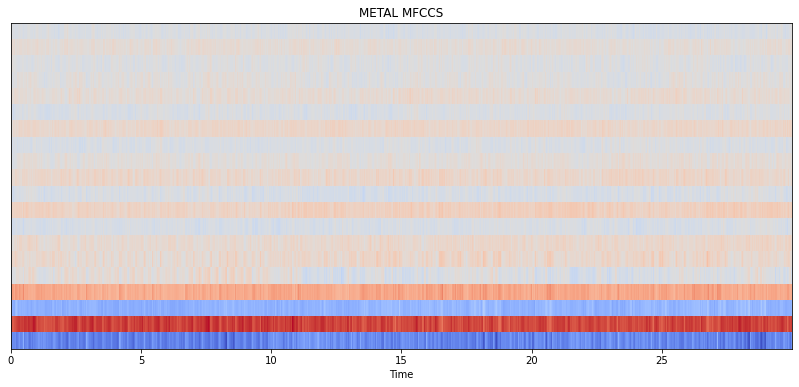

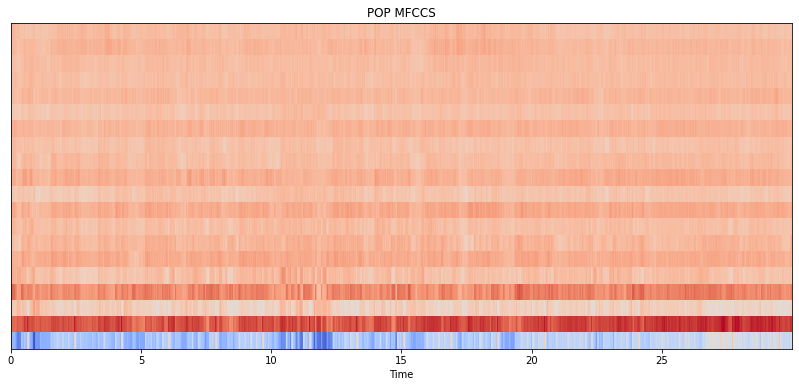

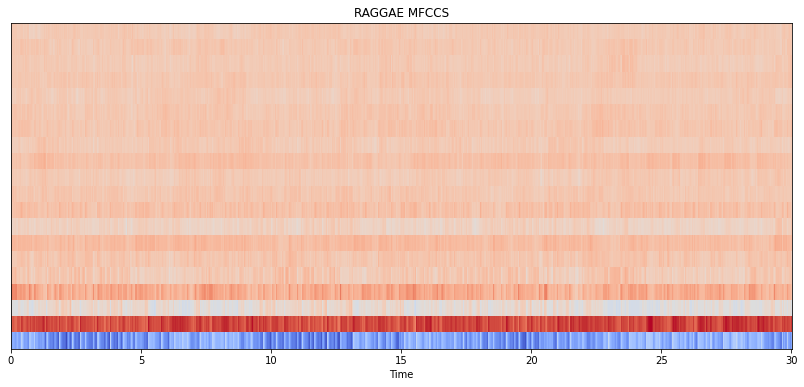

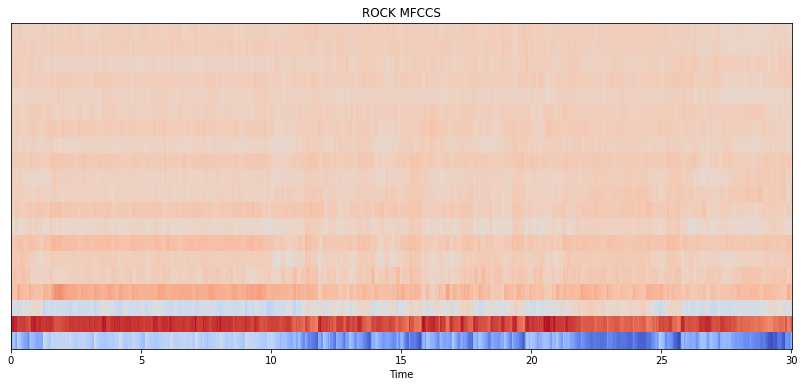

In [128]:
for genre, song in songs.items():
    mfccs = librosa.feature.mfcc(song, sr=sr)
    print(mfccs.shape)
    plt.figure(figsize=(14, 6))
    librosa.display.specshow(mfccs, sr=sr, x_axis='time')
    plt.title(genre + ' MFCCS')

In [129]:
# another CNN algorithm

In [133]:
y

array([0, 0, 0, ..., 9, 9, 9])

In [134]:
# Using CNN algorithm
from keras.models import Sequential
from keras.layers import Dense,Activation,Dropout
from keras.callbacks import EarlyStopping, ModelCheckpoint

In [135]:
# building model

model = Sequential()

model.add(Dense(512,input_shape=(X_train.shape[1],),activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(256,activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(128,activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(64,activation='relu'))
model.add(Dropout(0.2))

model.add(Dense(10,activation='softmax'))


model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_5 (Dense)             (None, 512)               30208     
                                                                 
 dropout_4 (Dropout)         (None, 512)               0         
                                                                 
 dense_6 (Dense)             (None, 256)               131328    
                                                                 
 dropout_5 (Dropout)         (None, 256)               0         
                                                                 
 dense_7 (Dense)             (None, 128)               32896     
                                                                 
 dropout_6 (Dropout)         (None, 128)               0         
                                                                 
 dense_8 (Dense)             (None, 64)               

In [136]:
model.compile(loss='sparse_categorical_crossentropy',optimizer='adam',metrics='accuracy')


In [137]:
earlystop = EarlyStopping(monitor='val_loss',mode='min',verbose=1,patience=10,min_delta=0.0001)
modelcheck = ModelCheckpoint('best_model.hdf5',monitor='val_accuracy',verbose=1,save_best_only=True,mode='max')

In [138]:
history = model.fit(X_train,y_train, validation_data=(X_test,y_test), epochs=600, callbacks=[earlystop,modelcheck], batch_size=128)

Epoch 1/600
49/53 [==========================>...] - ETA: 0s - loss: 1.7074 - accuracy: 0.3922
Epoch 1: val_accuracy improved from -inf to 0.61541, saving model to best_model.hdf5
53/53 [==============================] - 2s 18ms/step - loss: 1.6793 - accuracy: 0.4018 - val_loss: 1.0986 - val_accuracy: 0.6154
Epoch 2/600
50/53 [===========================>..] - ETA: 0s - loss: 1.1569 - accuracy: 0.5928
Epoch 2: val_accuracy improved from 0.61541 to 0.70185, saving model to best_model.hdf5
53/53 [==============================] - 1s 11ms/step - loss: 1.1534 - accuracy: 0.5944 - val_loss: 0.8553 - val_accuracy: 0.7019
Epoch 3/600
50/53 [===========================>..] - ETA: 0s - loss: 0.9408 - accuracy: 0.6727
Epoch 3: val_accuracy improved from 0.70185 to 0.74917, saving model to best_model.hdf5
53/53 [==============================] - 1s 20ms/step - loss: 0.9406 - accuracy: 0.6738 - val_loss: 0.7254 - val_accuracy: 0.7492
Epoch 4/600
51/53 [===========================>..] - ETA: 0s - l

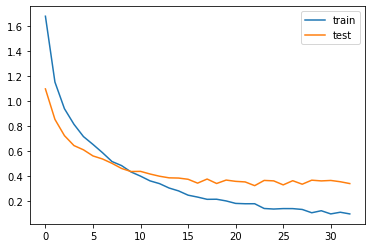

In [139]:
from matplotlib import pyplot 
pyplot.plot(history.history['loss'], label='train') 
pyplot.plot(history.history['val_loss'], label='test') 
pyplot.legend()
pyplot.show()

In [141]:
test_loss, test_accuracy = model.evaluate(X_test,y_test,batch_size=128)
print("Test loss : ",test_loss)
print("\nBest test accuracy : ",test_accuracy*100)

26/26 [==============================] - 0s 2ms/step - loss: 0.3422 - accuracy: 0.9054
Test loss :  0.3421735167503357

Best test accuracy :  90.53685069084167


Another CNN model

In [142]:
from tensorflow.keras.models import Sequential


In [143]:
def trainModel(model,epochs,optimizer):
    batch_size=128
    model.compile(optimizer=optimizer,loss='sparse_categorical_crossentropy',metrics='accuracy')
    return model.fit(X_train,y_train,validation_data=(X_test,y_test),epochs=epochs,batch_size=batch_size)

In [144]:
def plotValidate(history):
    print("Validation Accuracy",max(history.history["val_accuracy"]))
    pd.DataFrame(history.history).plot(figsize=(12,6))
    plt.show()

In [145]:
import tensorflow as tf


In [146]:
model=tf.keras.models.Sequential([
    tf.keras.layers.Dense(512,activation='relu',input_shape=(X_train.shape[1],)),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Dense(256,activation='relu'),
    keras.layers.Dropout(0.2),
    
    tf.keras.layers.Dense(128,activation='relu'),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Dense(64,activation='relu'),
    tf.keras.layers.Dropout(0.2),
    
    tf.keras.layers.Dense(10,activation='softmax'),
])

print(model.summary())
model_history=trainModel(model=model,epochs=600,optimizer='adam')

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 512)               30208     
                                                                 
 dropout_8 (Dropout)         (None, 512)               0         
                                                                 
 dense_11 (Dense)            (None, 256)               131328    
                                                                 
 dropout_9 (Dropout)         (None, 256)               0         
                                                                 
 dense_12 (Dense)            (None, 128)               32896     
                                                                 
 dropout_10 (Dropout)        (None, 128)               0         
                                                                 
 dense_13 (Dense)            (None, 64)               

Model Evaluation¶


In [147]:
test_loss,test_acc=model.evaluate(X_test,y_test,batch_size=128)
print("The test loss is ",test_loss)
print("The best accuracy is: ",test_acc*100)

26/26 [==============================] - 0s 1ms/step - loss: 0.5438 - accuracy: 0.9236
The test loss is  0.5437968373298645
The best accuracy is:  92.35668778419495


For the CNN model, we had used the Adam optimizer for training the model. The epoch that was chosen for the training model is 600. All of the hidden layers are using the RELU activation function and the output layer uses the softmax function. The loss is calculated using the sparse_categorical_crossentropy function. Dropout is used to prevent overfitting. We chose the Adam optimizer because it gave us the best results after evaluating other optimizers. The model accuracy can be increased by further increasing the epochs but after a certain period, we may achieve a threshold, so the value should be determined accordingly.

The model accuracy can be increased by further increasing the epochs but after a certain period, we may achieve a threshold, so the value should be determined accordingly. The accuracy we achieved for the test set is 92.14 percent which is very decent. So we come to the conclusion that Neural Networks are very effective in machine learning models. Tensorflow is very useful in implementing Convolutional Neural Network (CNN) that helps in the classifying process.

### using proper different models

In [186]:
'''
Here we will do the following task:-
    * We will first import the libraries we want for machine learning.  
    * We will use the feature_3_sec.csv for building and testing.
    * We will use Random Forest, KNN, XGBoost and support vector machine.
'''

from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split as tts
from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve, precision_score, recall_score, f1_score
# Feature ranking with recursive feature elimination
from sklearn.feature_selection import RFE

In [187]:
data = pd.read_csv(r'C:\Users\wwwKa\OneDrive\Desktop\Machine\PRML Team Project\Data\features_3_sec.csv')
data.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [201]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [204]:
data['label'] = le.fit_transform(data['label'])



In [205]:
# Splitting data
# We will remove column 'filename' since all the data in this column is unique.
# We will remove 'length' column since all the data in this column is same.

df = data.iloc[0:, 2:]

y = df['label'].values
X = df.drop('label', axis=1)

scale = MinMaxScaler()
scaled_data = scale.fit_transform(X)
X = pd.DataFrame(scaled_data, columns = X.columns).values

array([[0.3553988 , 0.71675699, 0.29313326, ..., 0.02679679, 0.50674637,
        0.04778078],
       [0.36732176, 0.67034733, 0.25303986, ..., 0.08241395, 0.59302914,
        0.06554772],
       [0.37315856, 0.72806736, 0.29675262, ..., 0.0438406 , 0.5462638 ,
        0.03606165],
       ...,
       [0.37419556, 0.69754793, 0.11650327, ..., 0.03992147, 0.50593726,
        0.04538043],
       [0.43653695, 0.65774457, 0.1482664 , ..., 0.01910101, 0.51990048,
        0.01373955],
       [0.40815099, 0.67614332, 0.11224896, ..., 0.03194326, 0.46137225,
        0.03454808]])

Since, human beings are lazy it is better to build a function to do net repeated tasks.

Firstly, we will split the dataset using KFold to get a better understanding of our models while evaluating.

Secondly, we will wait for the kernel to perform it's magic.

In [189]:
def model_build(model, kf, title = "Default"):
    accuracy_scores = []
    precision_scores = []
    recall_scores = []
    f1_scores = []
    for train_index, test_index in kf.split(X):
        X_train, X_test = X[train_index], X[test_index]
        y_train, y_test = y[train_index], y[test_index]
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        accuracy_scores.append(accuracy_score(y_test, y_pred))
    print("Accuracy score of", title, "is:", round(np.mean(accuracy_scores), 2))
    # Let's see the confusion matrix of the last split for a little insight
    con_mat = confusion_matrix(y_test, y_pred)
    plt.figure(figsize = (16, 9))
    sns.heatmap(con_mat, cmap="Blues", annot=True, 
                xticklabels = ["blues", "classical", "country", "disco", 
                               "hiphop", "jazz", "metal", "pop", "reggae", "rock"], 
                yticklabels=["blues", "classical", "country", "disco", "hiphop", 
                             "jazz", "metal", "pop", "reggae", "rock"])
    plt.show()
    

# Leave 2 blank spaces after a function definition

In [190]:
split = KFold(n_splits=5, shuffle=True)

Accuracy score of Random Forest Classifier is: 0.81


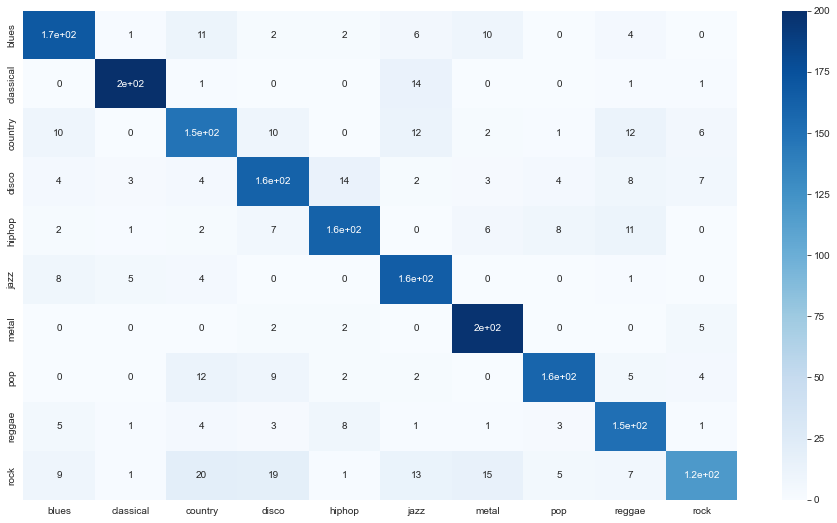

In [191]:
# Random Forest Classifer

rfc = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=10)
model_build(rfc, split, 'Random Forest Classifier')

Accuracy score of K Nearest Neighbor is: 0.87


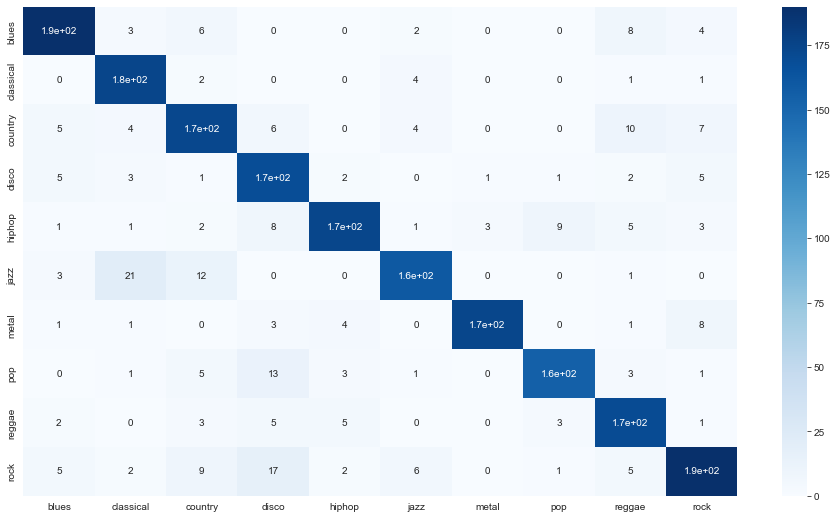

In [192]:
# K Nearest Neighbor

knn = KNeighborsClassifier(n_neighbors=10)
model_build(knn, split, 'K Nearest Neighbor')

In [197]:
y = data['label'].values

array(['blues', 'blues', 'blues', ..., 'rock', 'rock', 'rock'],
      dtype=object)

Accuracy score of XG Boost is: 0.9


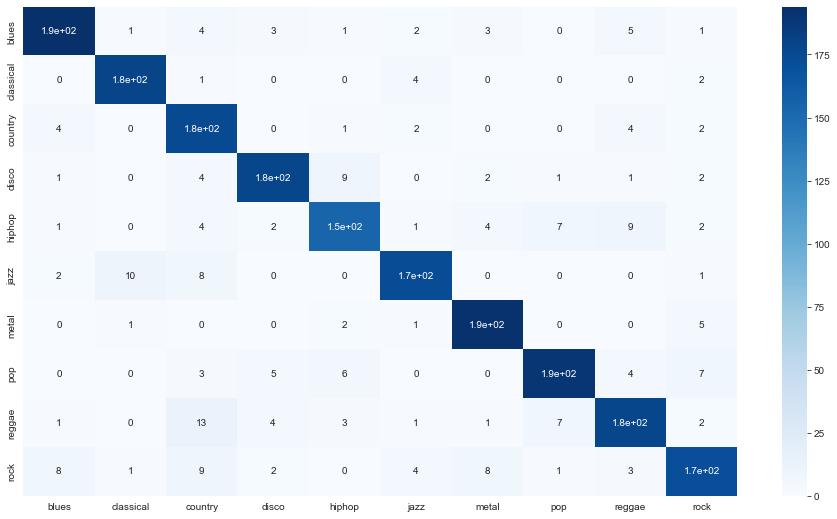

In [206]:
# XG Boost

xgb = XGBClassifier()
model_build(xgb, split, 'XG Boost')

Sixth Step: Tuning the model.

In [207]:
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.25, random_state=1)
model = XGBClassifier(n_estimators=1000, learning_rate=0.3)
model.fit(X_train, y_train)

XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
              importance_type=None, interaction_constraints='',
              learning_rate=0.3, max_bin=256, max_cat_to_onehot=4,
              max_delta_step=0, max_depth=6, max_leaves=0, min_child_weight=1,
              missing=nan, monotone_constraints='()', n_estimators=1000,
              n_jobs=0, num_parallel_tree=1, objective='multi:softprob',
              predictor='auto', random_state=0, reg_alpha=0, ...)

In [208]:
y_pred = model.predict(X_test)
print('Accuracy', ':', round(accuracy_score(y_test, y_pred), 5))

Accuracy : 0.91033


CNN